```python
file1 \_ |-----------------------------------|   -+-
file2 \_ |-----------------------------------|    |   training data
file3 \_ |-----------------------------------|    |        80%
file4 \_ |-----------------------------------|    |
                                                 -+-
file5 \_ |-----------------------------------|    |  validation data
file6 \_ |-----------------------------------|    |        20%
         |-----------------------------------|   -+-
```

In [1]:
import os
import glob

import numpy as np
import pandas as pd
import zipfile
import matplotlib.pyplot as plt
from tqdm import tqdm
import math

from utils.MovingAverager import *

# 讀檔

In [2]:
def rename_data(df):
    new_names = ['system_time', 'acc_times', 'acc_x', 'acc_y', 'acc_z', 'gyo_times', 'gyo_x', 'gyo_y', 'gyo_z', 'lin_acc_times', 'lin_acc_x', 'lin_acc_y', 'lin_acc_z', 'mag_times', 'mag_x', 'mag_y', 'mag_z']
    df.columns = new_names
    
    return df


def device_start_system_time(path):
    time_df = pd.read_csv(path, delimiter=';', index_col=0)
    time = time_df.T.loc['system time', 'START']
    
    return time


def gen_total_mag(df: pd.DataFrame):
    df['mag_x'] = moving_average(df['mag_x'], 11)
    df['mag_y'] = moving_average(df['mag_y'], 11)
    df['mag_z'] = moving_average(df['mag_z'], 11)
    df['mag_h'] = np.sqrt((df['mag_x'] ** 2) + (df['mag_y'] ** 2))
    df['mag_v'] = df['mag_z']
    df['mag_t'] = np.sqrt((df['mag_x'] ** 2) + (df['mag_y'] ** 2) + (df['mag_z'] ** 2))
    
    return df


def calculate_angle(df):
    df['acc_x'] = moving_average(df['acc_x'], 11)
    df['acc_y'] = moving_average(df['acc_y'], 11)
    df['acc_z'] = moving_average(df['acc_z'], 11)

    df['lin_acc_x'] = moving_average(df['lin_acc_x'], 11)
    df['lin_acc_y'] = moving_average(df['lin_acc_y'], 11)
    df['lin_acc_z'] = moving_average(df['lin_acc_z'], 11)
    
    df['acc_t'] = np.sqrt((df['acc_x'] ** 2) + (df['acc_y'] ** 2) + (df['acc_z'] ** 2))
    df[['gacc_x', 'gacc_y', 'gacc_z']] = df[['acc_x', 'acc_y', 'acc_z']].to_numpy() - df[['lin_acc_x', 'lin_acc_y', 'lin_acc_z']].to_numpy()
    df['gacc_t'] = np.sqrt((df['gacc_x'] ** 2) + (df['gacc_y'] ** 2) + (df['gacc_z'] ** 2))

    acc_xyz = df[['acc_x', 'acc_y', 'acc_z']].to_numpy()
    acc_t = df['acc_t'].to_numpy()
    gacc_t = df['gacc_t'].to_numpy()
    gacc_xyz = np.concatenate((np.zeros((len(df), 2)), gacc_t[:, None]), axis=-1)

    df['angle'] = np.arccos((np.sum(acc_xyz * gacc_xyz, axis=-1)) / (acc_t *  gacc_t)) / np.pi * 180
    
    return df


def get_rotation_matrix(angle):
    pitch = 0
    roll = angle / 180 * np.pi
    yaw = 0
    p_m = [[np.cos(pitch), 0, np.sin(pitch)], [0, 1, 0], [-np.sin(pitch), 0, np.cos(pitch)]]
    y_m = [[1, 0, 0], [0, np.cos(roll), -np.sin(roll)], [0, np.sin(roll), np.cos(roll)]]
    r_m = [[np.cos(yaw), -np.sin(yaw), 0], [np.sin(yaw), np.cos(yaw), 0], [0, 0, 1]]
    
    p_m, y_m, r_m = np.array(p_m), np.array(y_m), np.array(r_m)
    rotation_matrix = p_m @ y_m @ r_m
    
    return rotation_matrix


def calculate_transform(row, column_name):
    R = get_rotation_matrix(row['angle'] - 45)
    new_row = R @ row[column_name]
    
    return new_row


def gen_45_mag(df):
    df[['mag_x', 'mag_y', 'mag_z']] = df.apply(lambda x: calculate_transform(x, ['mag_x', 'mag_y', 'mag_z']), axis=1, result_type='expand')
    df['mag_h'] = np.sqrt((df['mag_x'] ** 2) + (df['mag_y'] ** 2))
    df['mag_v'] = df['mag_z']
    df['mag_t'] = np.sqrt((df['mag_x'] ** 2) + (df['mag_y'] ** 2) + (df['mag_z'] ** 2))
    return df


def select_data(df):
    return df[['lin_acc_x', 'lin_acc_y', 'lin_acc_z', 'gyo_x', 'gyo_y', 'gyo_z', 'angle', 'mag_x', 'mag_y', 'mag_z', 'mag_h', 'mag_v', 'mag_t', 'system_time']]


def load_original_data(path, rotate=False):
    acc_df = pd.read_csv(os.path.join(path, 'Accelerometer.csv'), delimiter=';')
    gyo_df = pd.read_csv(os.path.join(path, 'Gyroscope.csv'), delimiter=';')
    linacc_df = pd.read_csv(os.path.join(path, 'Linear Accelerometer.csv'), delimiter=';')
    mag_df = pd.read_csv(os.path.join(path, 'Magnetometer.csv'), delimiter=';')
    start_time = device_start_system_time(os.path.join(path, 'meta/time.csv'))
    time_df = acc_df.iloc[:, 0] + start_time
    
    total_df = pd.concat([time_df, acc_df, gyo_df, linacc_df, mag_df], axis=1)
    total_df = total_df[:-5]  # remove last None value row
    total_df = rename_data(total_df)
    total_df = gen_total_mag(total_df)
    total_df = calculate_angle(total_df)
    
    if rotate:
        total_df = gen_45_mag(total_df)
    total_df = select_data(total_df)
    return total_df

In [3]:
def align_data(source_df, target_df):
    source_start_time = source_df.loc[0, 'system_time']
    target_start_time = target_df.loc[0, 'system_time']
    
    # align start time
    if source_start_time > target_start_time:  # source start time > target start time
        target_start_idx = np.argmin(np.abs(target_df.system_time - source_start_time))
        target_df = target_df.iloc[target_start_idx:].reset_index(drop=True)
    else:  # source start time < target start time
        source_start_idx = np.argmin(np.abs(source_df.system_time - target_start_time))
        source_df = source_df.iloc[source_start_idx:].reset_index(drop=True)
        
    # align end idx
    end_idx = min(len(source_df), len(target_df))
    source_df = source_df.iloc[:end_idx]
    target_df = target_df.iloc[:end_idx]
    
    return source_df, target_df


def bound_range(df):
    start = datapoint_per_second * 35
    end = len(df) - datapoint_per_second * 20
    
    return df.iloc[start:end].reset_index(drop=True)


def split_segments(df, seq_len=25):
    num_of_segs = int(np.floor(len(df) / seq_len))
    
    segments = []
    for i in range(num_of_segs):
        seg = df.iloc[int(i * seq_len):int((i + 1) * seq_len)].to_numpy()
        segments.append(seg)
        
    return segments


def split_segments_overlap(df, seq_len=25, shift=15):
    
    segments = []
    for i in range(0, len(df) - seq_len, shift):
        seg = df.iloc[i:i + seq_len].to_numpy()
        segments.append(seg)
        
    return segments


def preprocess_data(df, seq_len=25, shift=15, is_train_data=False):
    if is_train_data:
        segs = split_segments_overlap(df, seq_len, shift)
    else:
        segs = split_segments(df, seq_len)
    
    return segs

In [4]:
def device_version(path):
    device_df = pd.read_csv(path, delimiter=';', index_col=0)
    version = device_df.loc['deviceRelease'].value
    
    return version


def check_data_device(source_path, target_path):
    while True:
        source_version = device_version(os.path.join(source_path, 'meta/device.csv'))
        target_version = device_version(os.path.join(target_path, 'meta/device.csv'))

#         print(source_path, target_path)

        if source_version[:2] == '15' and target_version[:2] == '16':
            return source_path, target_path
        elif source_version[:2] == '16' and target_version[:2] == '15':
            source_path = os.path.join(folder_path, 'target')
            target_path = os.path.join(folder_path, 'source')
            print('--- GG ---')
            continue
        else:
            raise


def load_pair_data(root_folder, class_num, file_index=None, is_train_data=False):
    prefix = 'train' if is_train_data else 'valid'
    pair_data = []
    folder_paths = glob.glob(f'*{os.path.normpath(root_folder)}/*')

    if file_index is not None:
        folder_paths = folder_paths[file_index[0]:file_index[1]]

    for i, folder_path in enumerate(folder_paths):
        source_path = os.path.join(folder_path, 'source')
        target_path = os.path.join(folder_path, 'target')
        
        print(f'{prefix} {i + 1: >3}: {folder_path}')
        
        #########################
        ##### check devices #####
        #########################
        source_path, target_path = check_data_device(source_path, target_path)
        
        ####################################
        ##### load and preprocess data #####
        ####################################
        source_df = load_original_data(source_path, rotate=False)
        target_df = load_original_data(target_path, rotate=True)
        
#         print(source_df.system_time[0], target_df.system_time[0])
        
        source_df, target_df = bound_range(source_df), bound_range(target_df)
        source_df, target_df = align_data(source_df, target_df)

        source_segs = preprocess_data(source_df, seq_len, shift, is_train_data)
        target_segs = preprocess_data(target_df, seq_len, shift, is_train_data)
        
        idx = min(len(source_segs), len(target_segs))
        source_tags = [class_num] * idx
        target_tags = [0] * idx
        
        pair_data.extend(zip(source_segs[:idx], source_tags, target_segs[:idx], target_tags))
    return pair_data

In [5]:
datapoint_per_second = 20
duration = 2
seq_len = 25
shift = 15  # the shfit of the data
classes = {0: 'target', 1: 'front_pocket', 2: 'pocket', 3: 'swing'}

In [6]:
source_device_version = device_version('./front_pocket/202302071523/source/meta/device.csv')
target_device_version = device_version('./front_pocket/202302071523/target/meta/device.csv')
print(f"source device version: {source_device_version}")  # source version: 15.4
print(f"target device version: {target_device_version}")  # target version: 16.3

source device version: 15.4
target device version: 16.3


In [7]:
train_front_pocket_pair_data = load_pair_data('./front_pocket', class_num=1, file_index=[0, 8], is_train_data=True)
valid_front_pocket_pair_data = load_pair_data('./front_pocket', class_num=1, file_index=[8, 10], is_train_data=False)

train_pocket_pair_data = load_pair_data('./pocket', class_num=2, file_index=[0, 8], is_train_data=True)
valid_pocket_pair_data = load_pair_data('./pocket', class_num=2, file_index=[8, 10], is_train_data=False)

train_swing_pair_data = load_pair_data('./swing', class_num=3, file_index=[0, 8], is_train_data=True)
valid_swing_pair_data = load_pair_data('./swing', class_num=3, file_index=[8, 10], is_train_data=False)

train   1: front_pocket/202302071628
train   2: front_pocket/202302071652
train   3: front_pocket/202302071523
train   4: front_pocket/202302071531
train   5: front_pocket/202302071715
train   6: front_pocket/202302071641
train   7: front_pocket/202302071541
train   8: front_pocket/202302071619
valid   1: front_pocket/202302071704
valid   2: front_pocket/202302071724
train   1: pocket/202302132108
train   2: pocket/202302131750
train   3: pocket/202302131601
train   4: pocket/202302071606
train   5: pocket/202302132053
train   6: pocket/202302122132
train   7: pocket/202302132116
train   8: pocket/202302131643
valid   1: pocket/202301101952
valid   2: pocket/202302132101
train   1: swing/202302142339
train   2: swing/202302132131
train   3: swing/202302142117
train   4: swing/202302132124
train   5: swing/202302121947
train   6: swing/202302121857
train   7: swing/202302142128
train   8: swing/202302121920
valid   1: swing/202302121909
valid   2: swing/202302142331


In [8]:
print(len(train_front_pocket_pair_data), len(train_pocket_pair_data), len(train_swing_pair_data))

3070 3003 2900


In [9]:
train_front_pocket_pair_data[0][0][0], train_front_pocket_pair_data[0][2][0]

(array([-3.50329294e-01,  1.51894025e-01,  2.26504005e-01, -2.18800381e-01,
        -2.56263137e-01, -2.19771296e-01,  8.89969956e+01,  1.90718285e+01,
        -1.88885755e+01,  3.45052268e+01,  2.68423718e+01,  3.45052268e+01,
         4.37163997e+01,  1.67575811e+09]),
 array([-1.29992731e-01, -1.10354979e-01,  1.42364870e-01, -5.08982837e-02,
        -8.86559859e-02,  1.07779831e-01,  5.22143092e+01, -3.91503539e+01,
        -5.46344827e+00, -2.09456325e+01,  3.95297290e+01, -2.09456325e+01,
         4.47361040e+01,  1.67575811e+09]))

# 建立dataloader

In [10]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, Dataset
from sklearn.metrics import accuracy_score

In [11]:
class PairDataset(Dataset):
    def __init__(self, source_data, source_label, target_data, target_label):
        self.source_data = source_data
        self.source_label = source_label
        self.target_data = target_data
        self.target_label = target_label

    def __len__(self):
        return len(self.source_data)

    def __getitem__(self, idx):
        return self.source_data[idx], self.source_label[idx], self.target_data[idx], self.target_label[idx]

In [12]:
class FirstDerivativeLoss(nn.Module):
    def __init__(self, weight=None, size_average=None, reduce=None, reduction='mean'):
        super(FirstDerivativeLoss, self).__init__()

    def forward(self, source, target):
        # calculate the first derivative
        source_o = torch.reshape(source, (len(source), -1))
        target_o = torch.reshape(target, (len(target), -1))
        d_source = source_o[1:] - source_o[:-1]
        d_target = target_o[1:] - target_o[:-1]
        deriv = d_source - d_target

        # calculate the loss as the mean squared error of the derivative
        loss = torch.mean(torch.pow(deriv, 2))

        return loss

In [13]:
def generator_loss(z_imu, target_imu, predict_mag, target_mag, source_total_mag, target_total_mag, source_mag_h, target_mag_h):
    imu_loss = mse_loss(z_imu, target_imu)
    mag_loss = mse_loss(predict_mag, target_mag)
    d1_loss = div_loss(predict_mag, target_mag)
    
    pred_total_mag = torch.sqrt(torch.sum(torch.pow(predict_mag, 2), dim=-1))
    
#     print(source_total_mag.shape, target_total_mag.shape, pred_total_mag.shape)
#     print(source_total_mag[0])
#     print(target_total_mag[0])
#     print(pred_total_mag[0])
    
    smag_limitation_loss = torch.mean(torch.abs(pred_total_mag - source_total_mag))
    tmag_limitation_loss = torch.mean(torch.abs(pred_total_mag - target_total_mag))
    
    pred_h = torch.sqrt(torch.sum(torch.pow(predict_mag[:, :, :2], 2), dim=-1))
    shmag_limitation_loss = torch.mean(torch.abs(pred_h - source_mag_h))
    thmag_limitation_loss = torch.mean(torch.abs(pred_h - target_mag_h))

    total_loss = imu_loss + mag_loss + d1_loss + \
                 smag_limitation_loss * 0.25 + tmag_limitation_loss * 0.75 + \
                 shmag_limitation_loss * 0.25 + thmag_limitation_loss * 0.75
    return total_loss, (imu_loss, mag_loss, d1_loss, (smag_limitation_loss, tmag_limitation_loss), (shmag_limitation_loss, thmag_limitation_loss))

# def discriminator_loss(d_real, d_fake):
#     real_loss = bce_loss(d_real, torch.ones_like(d_real))
#     fake_loss = bce_loss(d_fake, torch.zeros_like(d_fake))

#     return real_loss + fake_loss

In [14]:
train_data = train_front_pocket_pair_data + train_pocket_pair_data + train_swing_pair_data
valid_data = valid_front_pocket_pair_data + valid_pocket_pair_data + valid_swing_pair_data

# train
train_source_data = np.array([d[0] for d in train_data])
train_source_label = np.array([d[1] for d in train_data])
train_target_data = np.array([d[2] for d in train_data])
train_target_label = np.array([d[3] for d in train_data])
train_dataset = PairDataset(
                    source_data = torch.tensor(train_source_data, dtype=torch.float),
                    source_label = train_source_label,
                    target_data = torch.tensor(train_target_data, dtype=torch.float),
                    target_label = train_target_label,
                )
train_loader = DataLoader(train_dataset, batch_size=512, shuffle=True)

# valid
valid_source_data = np.array([d[0] for d in valid_data])
valid_source_label = np.array([d[1] for d in valid_data])
valid_target_data = np.array([d[2] for d in valid_data])
valid_target_label = np.array([d[3] for d in valid_data])
valid_dataset = PairDataset(
                    source_data = torch.tensor(valid_source_data, dtype=torch.float),
                    source_label = valid_source_label,
                    target_data = torch.tensor(valid_target_data, dtype=torch.float),
                    target_label = valid_target_label,
                )
valid_loader = DataLoader(valid_dataset, batch_size=512)

In [15]:
batch = next(iter(train_loader))

In [16]:
EPOCH = 6000
num_of_classes = 4
device = torch.device("cuda" if (torch.cuda.is_available()) else "cpu")
ce_loss = torch.nn.CrossEntropyLoss()
mse_loss = torch.nn.MSELoss()
bce_loss = torch.nn.BCELoss()
div_loss = FirstDerivativeLoss()

In [17]:
def get_tgt_mask(size) -> torch.tensor:
    # Generates a squeare matrix where the each row allows one word more to be seen
    mask = torch.tril(torch.ones(size, size) == 1) # Lower triangular matrix
    mask = mask.float()
    mask = mask.masked_fill(mask == 0, float('-inf')) # Convert zeros to -inf
    mask = mask.masked_fill(mask == 1, float(0.0)) # Convert ones to 0

    # EX for size=5:
    # [[0., -inf, -inf, -inf, -inf],
    #  [0.,   0., -inf, -inf, -inf],
    #  [0.,   0.,   0., -inf, -inf],
    #  [0.,   0.,   0.,   0., -inf],
    #  [0.,   0.,   0.,   0.,   0.]]

    return mask

In [18]:
class Classifier(nn.Module):
    def __init__(self, seq_len=21, num_of_classes=2):
        super(Classifier, self).__init__()
        
        self.seq_len = seq_len
        self.num_of_classes = num_of_classes
        
        self.nn = nn.Sequential(
            nn.Linear(6, 16),
            nn.SELU(),
            nn.Linear(16, 16),
            nn.SELU(),
        )
        
        # 16 * (seq_len-8)
        self.rnn = nn.RNN(input_size=16, hidden_size=32, num_layers=2, batch_first=True, bidirectional=True)
        
        self.last = nn.Sequential(
            nn.Linear(64 * self.seq_len, 16),
            nn.Tanh(),
            nn.Linear(16, num_of_classes),
        )
        
    def forward(self, x):  # input: (bs, seq_len, 6)
        h = self.nn(x)

        hz, _ = self.rnn(h)
        
        hz = hz.reshape(len(x), -1)
        out = self.last(hz)

        out = torch.reshape(out, (len(x), self.num_of_classes))
        
        return out, hz
    
    def predict_label(self, x):
        predict_probability, _ = self(x)
        predict_probability = predict_probability.reshape((-1, self.num_of_classes))
        _, predict_class = torch.max(predict_probability, 1)
        pred_one_hot = F.one_hot(predict_class, num_classes=self.num_of_classes).to(device).float()
        pred_one_hot = pred_one_hot.reshape(-1, self.num_of_classes)
        
        return predict_class, pred_one_hot

In [19]:
class PositionalEncoding(nn.Module):
    def __init__(self, d_model, dropout=0.1, max_len=5000):
        super(PositionalEncoding, self).__init__()
        self.dropout = nn.Dropout(p=dropout)

        pe = torch.zeros(max_len, d_model)
        position = torch.arange(0, max_len, dtype=torch.float).unsqueeze(1)
        div_term = torch.exp(torch.arange(0, d_model, 2).float() * (-math.log(10000.0) / d_model))
        pe[:, 0::2] = torch.sin(position * div_term)
        pe[:, 1::2] = torch.cos(position * div_term)
        pe = pe.unsqueeze(0).transpose(0, 1)
        self.register_buffer('pe', pe)

    def forward(self, x):
        x = x + self.pe[:x.size(0), :].to(x.device)
        return self.dropout(x)
    

class NotSimpleTransformer(nn.Module):
    def __init__(self, seq_len=21, num_of_classes=2):
        super(NotSimpleTransformer, self).__init__()
        
        self.seq_len = seq_len
        self.num_of_classes = num_of_classes
        
        self.imu_layer = nn.Sequential(
            nn.Linear(6, 8),
            nn.LeakyReLU(),
            nn.Linear(8, 32),
            nn.LeakyReLU(),
        )
        self.mag_layer = nn.Sequential(
            nn.Linear(3, 8),
            nn.LeakyReLU(),
            nn.Linear(8, 32),
            nn.LeakyReLU(),
        )
        self.pos_encoder = PositionalEncoding(32, 0.1)
        
        self.encoder = nn.TransformerEncoder(nn.TransformerEncoderLayer(d_model=32, nhead=8, dropout=0.1, batch_first=True), num_layers=1)
        self.nn = nn.Sequential(
            nn.Linear(32, 8),
            nn.LeakyReLU(),
            nn.Linear(8, 6),
            nn.LeakyReLU(),
        )
        
        self.task_controller = nn.Sequential(
            nn.Linear(38, 32),
            nn.LeakyReLU(),
            nn.Linear(32, 16),
            nn.LeakyReLU(), 
            nn.Linear(16, 32 * 3),
            nn.LeakyReLU(),
        )
        
        self.decoder = nn.TransformerDecoder(nn.TransformerDecoderLayer(d_model=32, nhead=8, dropout=0.1, batch_first=True), num_layers=1)
        
        self.mag_last = nn.Sequential(
            nn.Linear(32, 16),
            nn.LeakyReLU(),
            nn.Linear(16, 3),
        )
        
    def forward(self, source_imu, source_mag, source_class, st_angle):
        
        ### step 1
        h_imu = self.imu_layer(source_imu)
        h_imu = self.pos_encoder(h_imu)
        
        h_mag = self.mag_layer(source_mag)
#         h_mag = self.pos_encoder(h_mag)
        
        ### step 2
        z = self.encoder(h_imu)
        z_imu = self.nn(z)
        
        ### step 3
        z_gap = torch.mean(z, dim=1)  # (bs, 64)
        task_latent = torch.concat([z_gap, source_class], dim=-1)  # (bs, 64) + (bs, 4) -> (bs, 68)
        task_latent = task_latent[:, None, :].repeat(1, self.seq_len, 1)  # (bs, 68) -> (bs, seq_len, 68)
        task_latent = torch.concat([task_latent, st_angle], dim=-1)  # (bs, seq_len, 68) + (bs, seq_len, 1) -> (bs, seq_len, 69)
        
        task_latent = self.task_controller(task_latent)
#         task_matrix = task_latent.reshape((len(source_imu), self.seq_len, 3, 3))

#         z_gap = torch.mean(z, dim=1)
#         task_latent = torch.concat([z_gap, source_class], dim=-1)
#         task_latent = self.task_controller(task_latent)
#         task_matrix = task_latent.reshape((len(source_mag), 3, 3))
        
        ### step 4
#         pred_latent = self.decoder(h_mag, z)
#         pred_mag = self.mag_last(pred_latent)
#         pred_latent = self.mag_last(pred_latent)

        h_mag = h_mag.reshape(len(source_imu) * self.seq_len, 1, -1)  # (bs * seq_len, 1, 3)
        task_matrix = task_latent.reshape(len(source_imu) * self.seq_len, 32, 3)  # (bs * seq_len, 3, 3)
        
        pred_mag = torch.matmul(h_mag, task_matrix)  # (bs * seq_len, 1, 3) * (bs * seq_len, 3, 3) -> (bs * seq_len, 1, 3)
        pred_mag = pred_mag.reshape(len(source_imu), self.seq_len, -1)
        
        return z_imu, pred_mag
        

# Train Classifier

In [20]:
classifier = Classifier(seq_len=seq_len, num_of_classes=num_of_classes).to(device)
optimizer_C = torch.optim.Adam(classifier.parameters(), lr=0.0005)
lr_scheduler_C = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer_C, T_max=50, eta_min=0.0000001)

In [21]:
from torchinfo import summary
summary(classifier, input_size=[(1, 25, 6)])

Layer (type:depth-idx)                   Output Shape              Param #
Classifier                               [1, 4]                    --
├─Sequential: 1-1                        [1, 25, 16]               --
│    └─Linear: 2-1                       [1, 25, 16]               112
│    └─SELU: 2-2                         [1, 25, 16]               --
│    └─Linear: 2-3                       [1, 25, 16]               272
│    └─SELU: 2-4                         [1, 25, 16]               --
├─RNN: 1-2                               [1, 25, 64]               9,472
├─Sequential: 1-3                        [1, 4]                    --
│    └─Linear: 2-5                       [1, 16]                   25,616
│    └─Tanh: 2-6                         [1, 16]                   --
│    └─Linear: 2-7                       [1, 4]                    68
Total params: 35,540
Trainable params: 35,540
Non-trainable params: 0
Total mult-adds (M): 0.26
Input size (MB): 0.00
Forward/backward pass size (

In [22]:
def train_C(model, dataloader, optimizer):
    model.train()

    losses = []
    accuracies = []

    for source_data, source_label, target_data, target_label in dataloader:
        optimizer.zero_grad()

        sequences = torch.concat([source_data[:, :, :6], target_data[::3, :, :6]])
        labels = torch.concat([source_label, target_label[::3]])
        
        sequences = sequences.to(device)
        one_hot = F.one_hot(labels, num_classes=num_of_classes).to(device).float()

        #############
        # generator #
        #############
        predict_probability, _ = model(sequences)
        
        loss = ce_loss(predict_probability, one_hot)
        
        # backward
        loss.backward()
        optimizer.step()
        
        _, predict_classes = torch.max(predict_probability, 1)
        predict_classes = predict_classes.cpu().detach().numpy()
        _, labels = torch.max(one_hot, 1)
        labels = labels.cpu().detach().numpy()
        
        losses.append(loss.item())
        accuracies.append(accuracy_score(labels, predict_classes))
    
    return np.mean(losses), np.mean(accuracies)

In [23]:
def evalute_C(model, dataloader):
    model.eval()

    losses = []
    accuracies = []
    
    with torch.no_grad():
        for source_data, source_label, target_data, target_label in dataloader:
            
            sequences = torch.concat([source_data[:, :, :6], target_data[:, :, :6]])
            labels = torch.concat([source_label, target_label])
            
            sequences = sequences.to(device)
            one_hot = F.one_hot(labels, num_classes=num_of_classes).to(device).float()

            #############
            # generator #
            #############
            predict_probability, _ = model(sequences[:, :, :9])
            
            loss = ce_loss(predict_probability, one_hot)

            _, predict_classes = torch.max(predict_probability, 1)
            predict_classes = predict_classes.cpu().detach().numpy()
            _, labels = torch.max(one_hot, 1)
            labels = labels.cpu().detach().numpy()
            
            losses.append(loss.item())
            accuracies.append(accuracy_score(labels, predict_classes))
    
    return np.mean(losses), np.mean(accuracies)

In [24]:
for epoch in range(200):
    train_loss, train_acc = train_C(classifier, train_loader, optimizer_C)
    lr_scheduler_C.step()
    valid_loss, valid_acc = evalute_C(classifier, valid_loader)

    if (1 + epoch) % 10 == 0:
        ep = str(epoch + 1).zfill(5)
        print(f'{ep}: train loss: {train_loss:2.3f}, acc: {train_acc:2.3f}   valid loss: {valid_loss:2.3f}, acc: {valid_acc:2.3f}')

00010: train loss: 0.450, acc: 0.741   valid loss: 0.443, acc: 0.840
00020: train loss: 0.218, acc: 0.957   valid loss: 0.221, acc: 0.978
00030: train loss: 0.163, acc: 0.968   valid loss: 0.167, acc: 0.980
00040: train loss: 0.140, acc: 0.972   valid loss: 0.151, acc: 0.976
00050: train loss: 0.133, acc: 0.974   valid loss: 0.149, acc: 0.976
00060: train loss: 0.129, acc: 0.976   valid loss: 0.146, acc: 0.976
00070: train loss: 0.108, acc: 0.982   valid loss: 0.128, acc: 0.978
00080: train loss: 0.077, acc: 0.990   valid loss: 0.085, acc: 0.987
00090: train loss: 0.049, acc: 0.995   valid loss: 0.051, acc: 0.994
00100: train loss: 0.032, acc: 0.997   valid loss: 0.035, acc: 0.996
00110: train loss: 0.023, acc: 0.998   valid loss: 0.021, acc: 0.999
00120: train loss: 0.017, acc: 0.999   valid loss: 0.016, acc: 0.999
00130: train loss: 0.014, acc: 0.999   valid loss: 0.013, acc: 1.000
00140: train loss: 0.013, acc: 1.000   valid loss: 0.012, acc: 1.000
00150: train loss: 0.013, acc: 0.9

In [25]:
classifier.predict_label(batch[0][:, :, :6].to(device))

(tensor([3, 2, 2, 2, 2, 1, 1, 1, 1, 2, 2, 1, 1, 1, 2, 2, 3, 2, 1, 2, 2, 2, 3, 1,
         2, 1, 3, 3, 2, 2, 2, 1, 3, 1, 1, 1, 3, 3, 3, 2, 2, 2, 3, 2, 3, 2, 2, 3,
         1, 1, 2, 2, 2, 2, 3, 2, 1, 1, 3, 2, 3, 3, 2, 1, 2, 2, 1, 1, 2, 2, 3, 3,
         2, 3, 2, 1, 2, 1, 2, 2, 1, 1, 1, 1, 3, 1, 3, 1, 3, 1, 2, 2, 3, 1, 2, 3,
         1, 2, 1, 3, 2, 1, 1, 1, 1, 3, 2, 2, 2, 1, 1, 3, 2, 1, 2, 1, 3, 3, 2, 1,
         3, 3, 2, 3, 1, 1, 2, 3, 1, 1, 3, 2, 3, 2, 1, 2, 1, 3, 1, 1, 2, 1, 1, 1,
         3, 2, 3, 3, 2, 1, 1, 3, 1, 3, 1, 1, 3, 3, 1, 2, 3, 1, 1, 3, 3, 3, 2, 1,
         3, 3, 1, 3, 1, 3, 1, 1, 2, 3, 2, 3, 2, 3, 3, 2, 2, 2, 1, 1, 1, 2, 2, 2,
         2, 1, 1, 2, 2, 3, 3, 2, 2, 1, 2, 3, 1, 3, 1, 2, 1, 2, 2, 1, 1, 3, 2, 2,
         2, 2, 2, 1, 2, 2, 3, 2, 3, 3, 3, 2, 3, 3, 2, 3, 1, 1, 1, 1, 1, 1, 2, 3,
         1, 2, 3, 2, 2, 3, 2, 3, 2, 2, 1, 2, 3, 3, 1, 2, 1, 2, 3, 1, 3, 2, 3, 3,
         1, 1, 2, 1, 3, 3, 1, 1, 2, 3, 3, 3, 2, 1, 2, 3, 1, 3, 2, 3, 3, 2, 2, 1,
         1, 3, 3, 1, 1, 3, 1

In [26]:
batch[1]

tensor([3, 2, 2, 2, 2, 1, 1, 1, 1, 2, 2, 1, 1, 1, 2, 2, 3, 2, 1, 2, 2, 2, 3, 1,
        2, 1, 3, 3, 2, 2, 2, 1, 3, 1, 1, 1, 3, 3, 3, 2, 2, 2, 3, 2, 3, 2, 2, 3,
        1, 1, 2, 2, 2, 2, 3, 2, 1, 1, 3, 2, 3, 3, 2, 1, 2, 2, 1, 1, 2, 2, 3, 3,
        2, 3, 2, 1, 2, 1, 2, 2, 1, 1, 1, 1, 3, 1, 3, 1, 3, 1, 2, 2, 3, 1, 2, 3,
        1, 2, 1, 3, 2, 1, 1, 1, 1, 3, 2, 2, 2, 1, 1, 3, 2, 1, 2, 1, 3, 3, 2, 1,
        3, 3, 2, 3, 1, 1, 2, 3, 1, 1, 3, 2, 3, 2, 1, 2, 1, 3, 1, 1, 2, 1, 1, 1,
        3, 2, 3, 3, 2, 1, 1, 3, 1, 3, 1, 1, 3, 3, 1, 2, 3, 1, 1, 3, 3, 3, 2, 1,
        3, 3, 1, 3, 1, 3, 1, 1, 2, 3, 2, 3, 2, 3, 3, 2, 2, 2, 1, 1, 1, 2, 2, 2,
        2, 1, 1, 2, 2, 3, 3, 2, 2, 1, 2, 3, 1, 3, 1, 2, 1, 2, 2, 1, 1, 3, 2, 2,
        2, 2, 2, 1, 2, 2, 3, 2, 3, 3, 3, 2, 3, 3, 2, 3, 1, 1, 1, 1, 1, 1, 2, 3,
        1, 2, 3, 2, 2, 3, 2, 3, 2, 2, 1, 2, 3, 3, 1, 2, 1, 2, 3, 1, 3, 2, 3, 3,
        1, 1, 2, 1, 3, 3, 1, 1, 2, 3, 3, 3, 2, 1, 2, 3, 1, 3, 2, 3, 3, 2, 2, 1,
        1, 3, 3, 1, 1, 3, 1, 2, 1, 1, 1,

# Full Train

In [27]:
model = NotSimpleTransformer(seq_len=seq_len, num_of_classes=num_of_classes).to(device)
# discriminator = Discriminator(chunk_size=chunk_size, seq_len=seq_len).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=0.00005)
# optimizer_D = torch.optim.Adam(discriminator.parameters(), lr=0.000025)

In [28]:
output = model(torch.empty(16, 25, 6).to(device), torch.empty(16, 25, 3).to(device), torch.empty(16, 4).to(device), torch.empty(16, 25, 2).to(device))
output[0].shape, output[1].shape

(torch.Size([16, 25, 6]), torch.Size([16, 25, 3]))

In [29]:
from torchinfo import summary
summary(model, input_size=[(1, 25, 6), (1, 25, 3), (1, 4), (1, 25, 2)])

Layer (type:depth-idx)                        Output Shape              Param #
NotSimpleTransformer                          [1, 25, 6]                142,371
├─Sequential: 1-1                             [1, 25, 32]               --
│    └─Linear: 2-1                            [1, 25, 8]                56
│    └─LeakyReLU: 2-2                         [1, 25, 8]                --
│    └─Linear: 2-3                            [1, 25, 32]               288
│    └─LeakyReLU: 2-4                         [1, 25, 32]               --
├─PositionalEncoding: 1-2                     [1, 25, 32]               --
│    └─Dropout: 2-5                           [1, 25, 32]               --
├─Sequential: 1-3                             [1, 25, 32]               --
│    └─Linear: 2-6                            [1, 25, 8]                32
│    └─LeakyReLU: 2-7                         [1, 25, 8]                --
│    └─Linear: 2-8                            [1, 25, 32]               288
│    └─LeakyR

In [30]:
def plot_result(result):
    pred_mag = result[0].reshape(-1, 3)
    targ_mag = result[1].reshape(-1, 3)
    x = np.arange(len(pred_mag))
    
    loss = mse_loss(torch.tensor(pred_mag), torch.tensor(targ_mag)).item()
    
    fig = plt.figure(figsize=(15, 5))
    
    for pm, tm, caxis, color in zip(pred_mag.T, targ_mag.T, ['h', 'v'], ['tab:blue', 'tab:orange']):
        plt.plot(x, pm, label=f'pred_{caxis}', color=color, linewidth=2.5, zorder=2)
        plt.plot(x, tm, '--', label=f'targ_{caxis}', color=color, linewidth=1, alpha=0.8, zorder=1)
    
    pred_total_mag = np.sqrt(np.sum(np.power(pred_mag, 2), axis=-1))
    targ_total_mag = np.sqrt(np.sum(np.power(targ_mag, 2), axis=-1))
    plt.plot(x, pred_total_mag, label=f'pred_t', color='tab:red', linewidth=2.5, zorder=2)
    plt.plot(x, targ_total_mag, '--', label=f'targ_t', color='tab:red', linewidth=1, alpha=0.8, zorder=1)
    
    plt.suptitle(f'Loss: {loss:.2f}')
    plt.legend()
    plt.show()

In [31]:
def train(dataloader, draw=False):
    model.train()
    classifier.eval()

    g_losses = []
    imu_losses = []
    mag_losses = []
    d1_losses = []
    tmag_lim_losses = []
    hmag_lim_losses = []

    for source_data, source_label, target_data, target_label in dataloader:
        optimizer.zero_grad()

        source_data = source_data.to(device)
        source_imu = source_data[:, :, :6]
        source_mag = source_data[:, :, 7:10]
        source_total_mag = source_data[:, :, 12]
        source_mag_h = source_data[:, :, 10]
        source_angle = source_data[:, :, 6]
        
        target_data = target_data.to(device)
        target_imu = target_data[:, :, :6]
        target_mag = target_data[:, :, 7:10]
        target_total_mag = target_data[:, :, 12]
        target_mag_h = source_data[:, :, 10]
        target_angle = source_data[:, :, 6]
        
        st_angle = torch.concat((source_angle[:, :, None], target_angle[:, :, None]), dim=-1)

        # generate mag
        source_pred_class, source_pred_one_hot = classifier.predict_label(source_imu)
        z_imu, predict_mag = model(source_imu, source_mag, source_pred_one_hot, st_angle)
        
        # generator loss
        gen_loss, (imu_loss, mag_loss, d1_loss, tmag_lim_loss, hmag_lim_loss) = generator_loss(z_imu, target_imu, predict_mag, target_mag,
                                                                                              source_total_mag, target_total_mag, source_mag_h, target_mag_h)
        
        # backward
        gen_loss.backward()
        optimizer.step()
        
        # record loss
        g_losses.append(gen_loss.item())
        imu_losses.append(imu_loss.item())
        mag_losses.append(mag_loss.item())
        d1_losses.append(d1_loss.item())
        tmag_lim_losses.append([tmag_lim_loss[0].item(), tmag_lim_loss[1].item()])
        hmag_lim_losses.append([hmag_lim_loss[0].item(), hmag_lim_loss[1].item()])
    
    if draw:
        rs = [predict_mag[0].detach().cpu().numpy(), target_mag[0].cpu().numpy()]
        plot_result(rs)
    
    g_losses = np.mean(g_losses)
    imu_losses = np.mean(imu_losses)
    mag_losses = np.mean(mag_losses)
    d1_losses = np.mean(d1_losses)
    tmag_lim_losses = np.mean(tmag_lim_losses, axis=0)
    hmag_lim_losses = np.mean(hmag_lim_losses, axis=0)
    return g_losses, (imu_losses, mag_losses, d1_losses, tmag_lim_losses, hmag_lim_losses)

In [32]:
def evalute(dataloader, draw=False):
    model.eval()
    classifier.eval()

    g_losses = []
    imu_losses = []
    mag_losses = []
    d1_losses = []
    tmag_lim_losses = []
    hmag_lim_losses = []
    
    with torch.no_grad():
        for source_data, source_label, target_data, target_label in dataloader:
            source_data = source_data.to(device)
            source_imu = source_data[:, :, :6]
            source_mag = source_data[:, :, 7:10]
            source_total_mag = source_data[:, :, 12]
            source_mag_h = source_data[:, :, 10]
            source_angle = source_data[:, :, 6]

            target_data = target_data.to(device)
            target_imu = target_data[:, :, :6]
            target_mag = target_data[:, :, 7:10]
            target_total_mag = target_data[:, :, 12]
            target_mag_h = source_data[:, :, 10]
            target_angle = source_data[:, :, 6]
            
            st_angle = torch.concat((source_angle[:, :, None], target_angle[:, :, None]), dim=-1)

            # generate mag
            source_pred_class, source_pred_one_hot = classifier.predict_label(source_imu)
            z_imu, predict_mag = model(source_imu, source_mag, source_pred_one_hot, st_angle)

            # generator loss
            gen_loss, (imu_loss, mag_loss, d1_loss, tmag_lim_loss, hmag_lim_loss) = generator_loss(z_imu, target_imu, predict_mag, target_mag,
                                                                                                  source_total_mag, target_total_mag, source_mag_h, target_mag_h)

            # record loss
            g_losses.append(gen_loss.item())
            imu_losses.append(imu_loss.item())
            mag_losses.append(mag_loss.item())
            d1_losses.append(d1_loss.item())
            tmag_lim_losses.append([tmag_lim_loss[0].item(), tmag_lim_loss[1].item()])
            hmag_lim_losses.append([hmag_lim_loss[0].item(), hmag_lim_loss[1].item()])
    
    if draw:
        rs = [predict_mag[0].detach().cpu().numpy(), target_mag[0].cpu().numpy()]
        plot_result(rs)
    
    g_losses = np.mean(g_losses)
    imu_losses = np.mean(imu_losses)
    mag_losses = np.mean(mag_losses)
    d1_losses = np.mean(d1_losses)
    tmag_lim_losses = np.mean(tmag_lim_losses, axis=0)
    hmag_lim_losses = np.mean(hmag_lim_losses, axis=0)
    return g_losses, (imu_losses, mag_losses, d1_losses, tmag_lim_losses, hmag_lim_losses)

In [33]:
for param in classifier.parameters():
    param.requires_grad = False

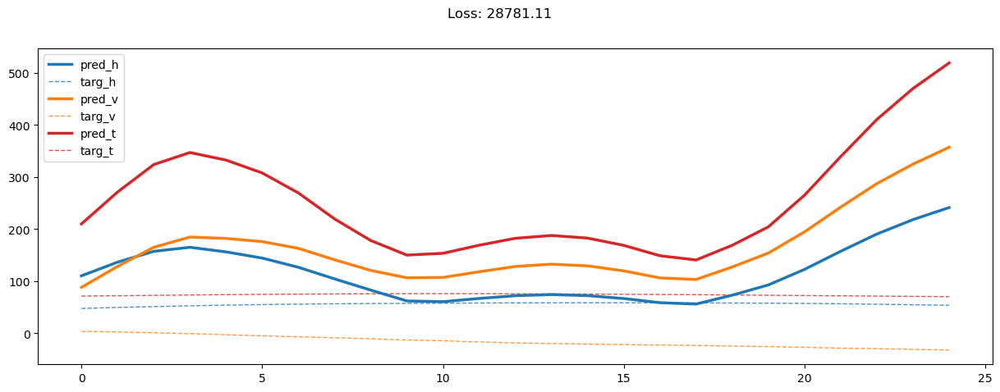

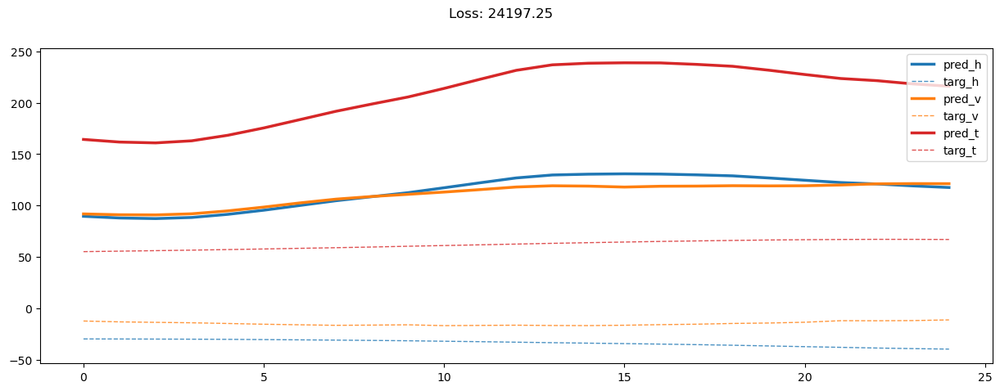

00020: train loss:  4048.295, imu loss:  0.142, mag loss:  2483.347, div loss:  1531.580, t_lim: ( 16.190,  16.696), h_lim: ( 16.657,  16.657)
       valid loss:  2421.152, imu loss:  0.109, mag loss:  2117.967, div loss:  272.135, t_lim: ( 14.536,  14.716), h_lim: ( 16.269,  16.269)
00040: train loss:  2001.837, imu loss:  0.143, mag loss:  993.119, div loss:  959.434, t_lim: ( 25.738,  25.720), h_lim: ( 23.417,  23.417)
       valid loss:  1146.670, imu loss:  0.109, mag loss:  935.257, div loss:  159.274, t_lim: ( 28.075,  27.535), h_lim: ( 24.360,  24.360)
00060: train loss:  1770.029, imu loss:  0.141, mag loss:  785.894, div loss:  923.368, t_lim: ( 33.560,  33.531), h_lim: ( 27.088,  27.088)
       valid loss:  973.734, imu loss:  0.109, mag loss:  767.051, div loss:  144.634, t_lim: ( 34.860,  34.320), h_lim: ( 27.485,  27.485)
00080: train loss:  1699.102, imu loss:  0.141, mag loss:  731.807, div loss:  902.735, t_lim: ( 36.117,  36.077), h_lim: ( 28.332,  28.332)
       vali

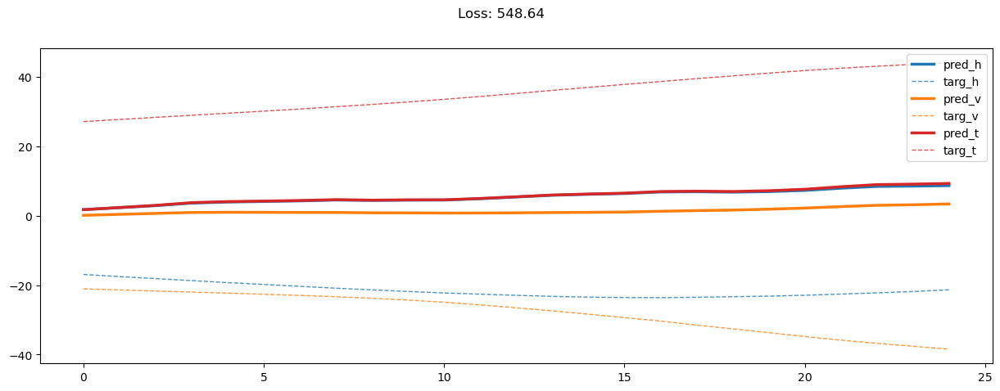

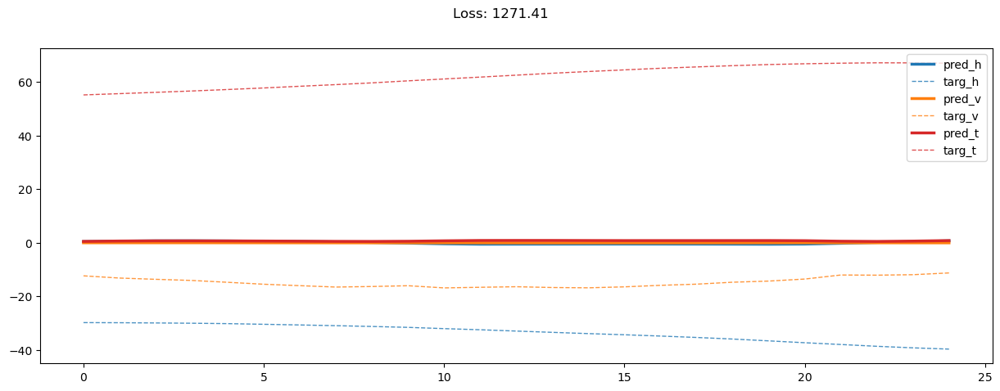

00200: train loss:  1548.521, imu loss:  0.140, mag loss:  648.642, div loss:  835.484, t_lim: ( 36.440,  36.414), h_lim: ( 27.834,  27.834)
       valid loss:  842.503, imu loss:  0.109, mag loss:  641.316, div loss:  134.871, t_lim: ( 38.005,  37.465), h_lim: ( 28.607,  28.607)
00220: train loss:  1539.829, imu loss:  0.141, mag loss:  644.171, div loss:  832.019, t_lim: ( 35.882,  35.858), h_lim: ( 27.634,  27.634)
       valid loss:  837.021, imu loss:  0.109, mag loss:  636.690, div loss:  134.666, t_lim: ( 37.539,  37.000), h_lim: ( 28.421,  28.421)
00240: train loss:  1517.564, imu loss:  0.142, mag loss:  639.499, div loss:  814.821, t_lim: ( 35.491,  35.482), h_lim: ( 27.618,  27.618)
       valid loss:  828.053, imu loss:  0.109, mag loss:  629.556, div loss:  133.737, t_lim: ( 36.838,  36.300), h_lim: ( 28.216,  28.216)
00260: train loss:  1494.805, imu loss:  0.141, mag loss:  626.429, div loss:  806.262, t_lim: ( 34.587,  34.586), h_lim: ( 27.387,  27.387)
       valid los

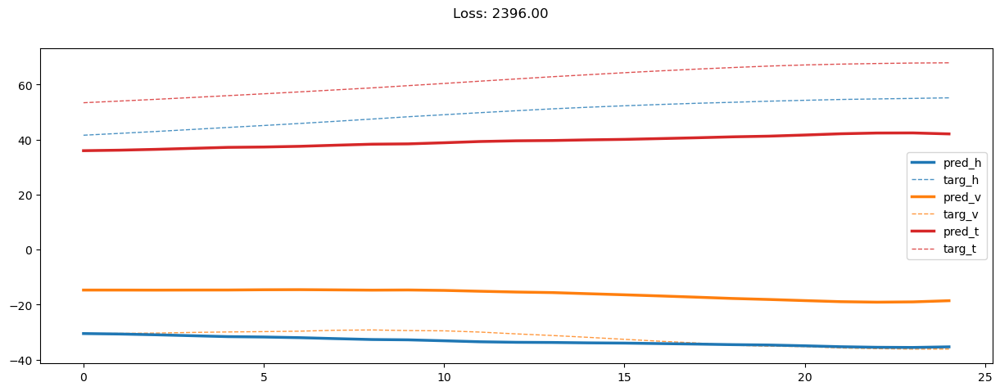

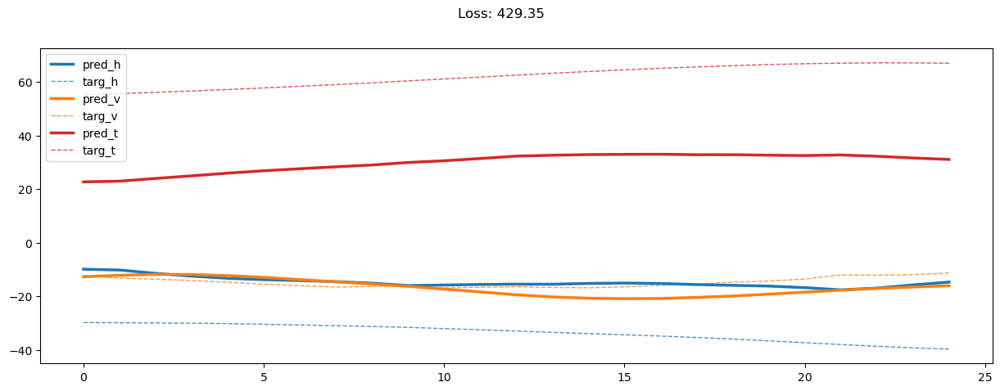

00400: train loss:  976.343, imu loss:  0.140, mag loss:  321.162, div loss:  624.742, t_lim: ( 15.592,  15.656), h_lim: ( 14.659,  14.659)
       valid loss:  424.966, imu loss:  0.108, mag loss:  276.468, div loss:  118.192, t_lim: ( 15.661,  15.240), h_lim: ( 14.852,  14.852)
00420: train loss:  950.391, imu loss:  0.141, mag loss:  309.370, div loss:  612.466, t_lim: ( 14.170,  14.267), h_lim: ( 14.171,  14.171)
       valid loss:  409.363, imu loss:  0.108, mag loss:  263.269, div loss:  117.951, t_lim: ( 14.040,  13.740), h_lim: ( 14.221,  14.221)
00440: train loss:  917.982, imu loss:  0.140, mag loss:  298.069, div loss:  592.241, t_lim: ( 13.362,  13.498), h_lim: ( 14.067,  14.067)
       valid loss:  397.180, imu loss:  0.108, mag loss:  252.224, div loss:  117.840, t_lim: ( 12.973,  12.843), h_lim: ( 14.133,  14.133)
00460: train loss:  890.445, imu loss:  0.141, mag loss:  288.514, div loss:  574.230, t_lim: ( 13.116,  13.269), h_lim: ( 14.330,  14.330)
       valid loss:  

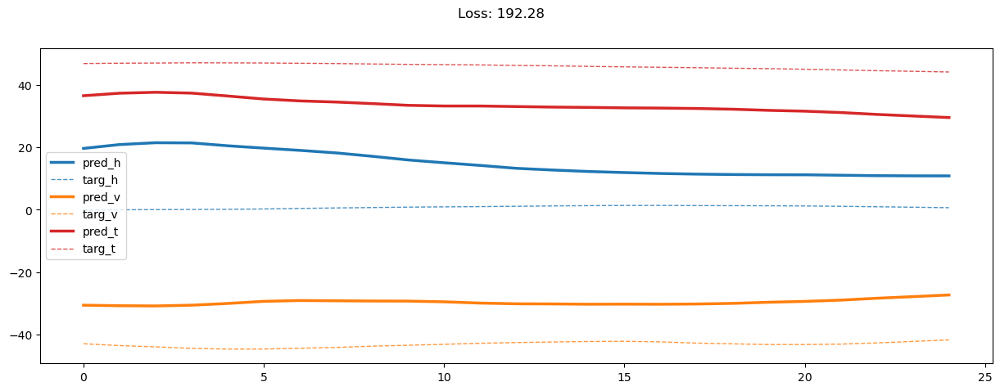

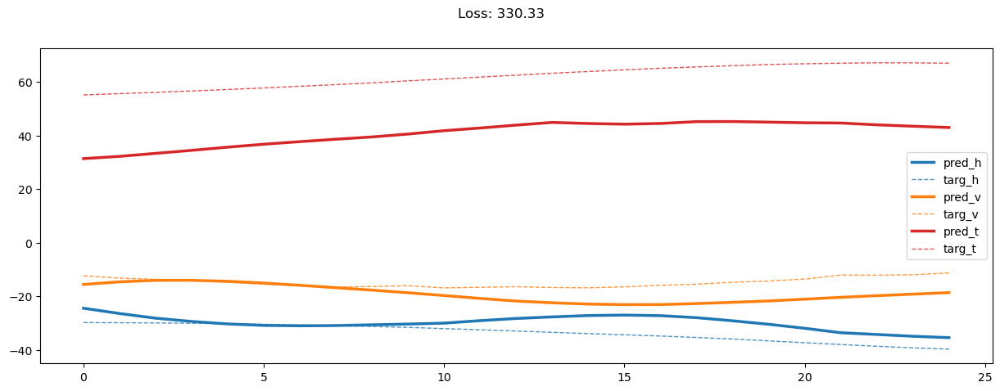

00600: train loss:  670.864, imu loss:  0.140, mag loss:  215.079, div loss:  430.764, t_lim: ( 9.783,  10.292), h_lim: ( 14.717,  14.717)
       valid loss:  314.247, imu loss:  0.108, mag loss:  169.232, div loss:  121.494, t_lim: ( 8.374,  9.024), h_lim: ( 14.551,  14.551)
00620: train loss:  653.813, imu loss:  0.140, mag loss:  208.851, div loss:  420.333, t_lim: ( 9.444,  10.011), h_lim: ( 14.620,  14.620)
       valid loss:  309.716, imu loss:  0.108, mag loss:  165.458, div loss:  121.208, t_lim: ( 8.045,  8.724), h_lim: ( 14.387,  14.387)
00640: train loss:  635.393, imu loss:  0.140, mag loss:  203.036, div loss:  407.980, t_lim: ( 9.089,  9.751), h_lim: ( 14.652,  14.652)
       valid loss:  307.268, imu loss:  0.108, mag loss:  162.431, div loss:  121.819, t_lim: ( 7.901,  8.655), h_lim: ( 14.444,  14.444)
00660: train loss:  608.969, imu loss:  0.140, mag loss:  195.136, div loss:  389.814, t_lim: ( 8.879,  9.533), h_lim: ( 14.511,  14.511)
       valid loss:  303.102, imu

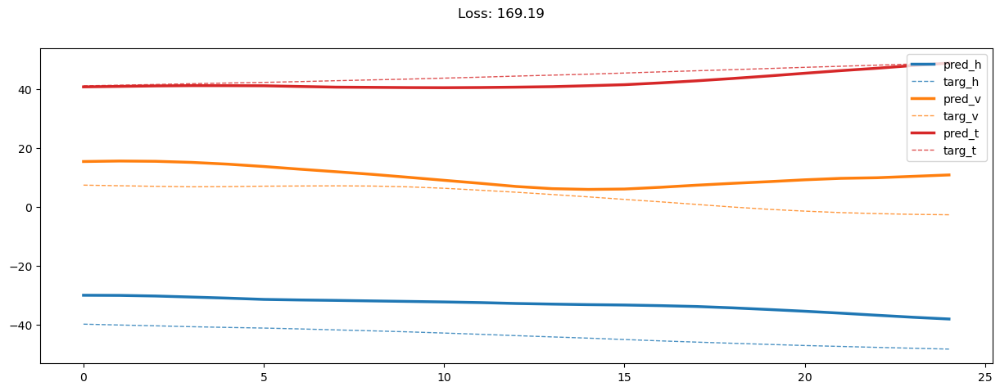

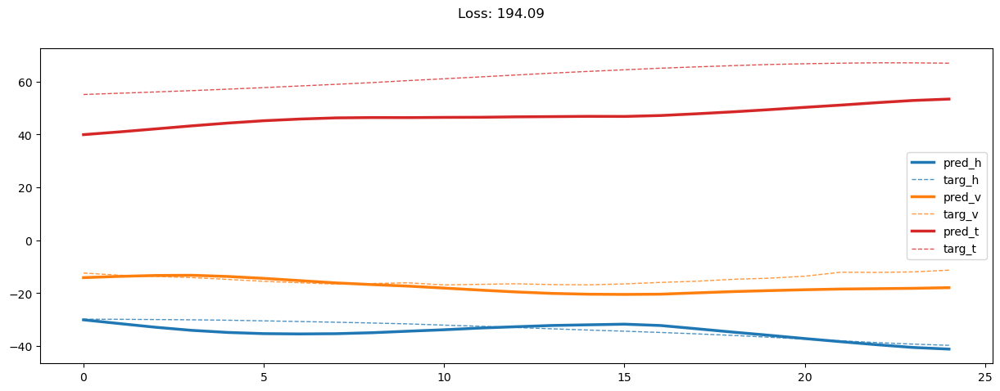

00800: train loss:  499.250, imu loss:  0.140, mag loss:  157.545, div loss:  319.250, t_lim: ( 7.446,  8.293), h_lim: ( 14.234,  14.234)
       valid loss:  277.794, imu loss:  0.107, mag loss:  138.429, div loss:  117.864, t_lim: ( 6.510,  7.589), h_lim: ( 14.074,  14.074)
00820: train loss:  469.745, imu loss:  0.140, mag loss:  150.105, div loss:  297.303, t_lim: ( 7.409,  8.189), h_lim: ( 14.204,  14.204)
       valid loss:  278.376, imu loss:  0.107, mag loss:  138.720, div loss:  118.142, t_lim: ( 6.466,  7.432), h_lim: ( 14.215,  14.215)
00840: train loss:  453.540, imu loss:  0.140, mag loss:  145.031, div loss:  286.313, t_lim: ( 7.296,  8.095), h_lim: ( 14.161,  14.161)
       valid loss:  277.679, imu loss:  0.107, mag loss:  137.712, div loss:  118.419, t_lim: ( 6.398,  7.355), h_lim: ( 14.325,  14.325)
00860: train loss:  440.865, imu loss:  0.139, mag loss:  140.718, div loss:  278.131, t_lim: ( 7.064,  7.886), h_lim: ( 14.195,  14.195)
       valid loss:  272.236, imu l

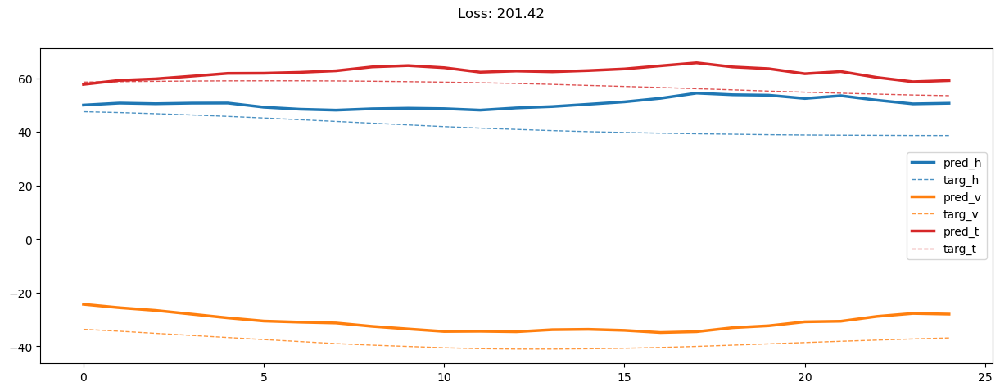

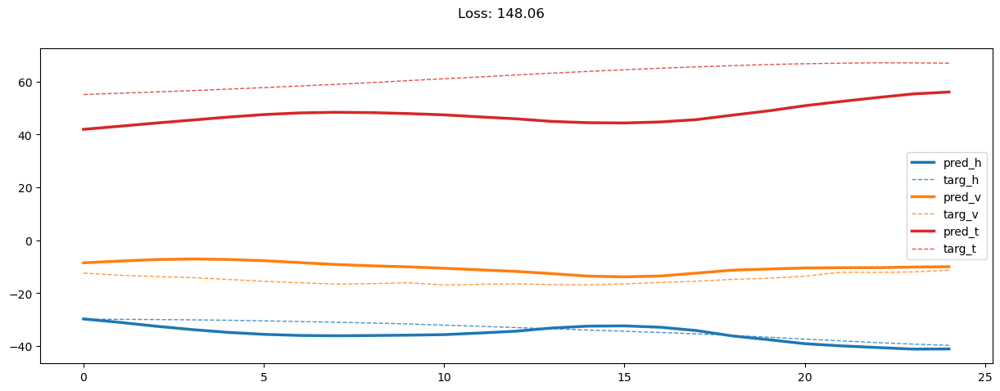

01000: train loss:  379.439, imu loss:  0.140, mag loss:  119.425, div loss:  238.656, t_lim: ( 6.319,  7.209), h_lim: ( 14.231,  14.231)
       valid loss:  248.644, imu loss:  0.107, mag loss:  115.669, div loss:  112.013, t_lim: ( 5.490,  6.552), h_lim: ( 14.569,  14.569)
01020: train loss:  368.995, imu loss:  0.140, mag loss:  116.903, div loss:  230.679, t_lim: ( 6.308,  7.180), h_lim: ( 14.311,  14.311)
       valid loss:  246.466, imu loss:  0.107, mag loss:  114.311, div loss:  111.363, t_lim: ( 5.403,  6.444), h_lim: ( 14.502,  14.502)
01040: train loss:  365.309, imu loss:  0.139, mag loss:  115.434, div loss:  228.797, t_lim: ( 6.058,  6.983), h_lim: ( 14.186,  14.186)
       valid loss:  244.004, imu loss:  0.107, mag loss:  112.813, div loss:  110.492, t_lim: ( 5.209,  6.324), h_lim: ( 14.548,  14.548)
01060: train loss:  360.052, imu loss:  0.140, mag loss:  112.400, div loss:  226.697, t_lim: ( 6.005,  6.934), h_lim: ( 14.113,  14.113)
       valid loss:  240.127, imu l

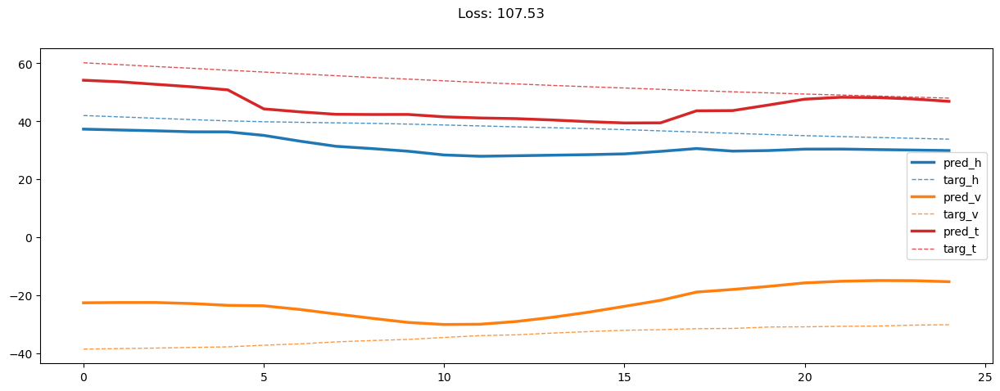

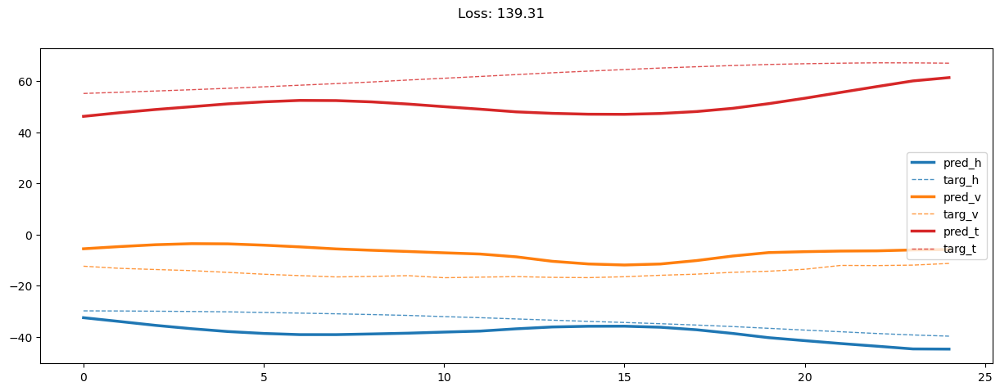

01200: train loss:  320.248, imu loss:  0.139, mag loss:  99.300, div loss:  200.517, t_lim: ( 5.420,  6.404), h_lim: ( 14.134,  14.134)
       valid loss:  227.053, imu loss:  0.107, mag loss:  102.407, div loss:  104.423, t_lim: ( 4.731,  5.964), h_lim: ( 14.461,  14.461)
01220: train loss:  311.179, imu loss:  0.140, mag loss:  96.991, div loss:  193.755, t_lim: ( 5.359,  6.369), h_lim: ( 14.177,  14.177)
       valid loss:  220.671, imu loss:  0.107, mag loss:  98.258, div loss:  102.404, t_lim: ( 4.498,  5.853), h_lim: ( 14.388,  14.388)
01240: train loss:  308.425, imu loss:  0.139, mag loss:  96.553, div loss:  191.486, t_lim: ( 5.378,  6.368), h_lim: ( 14.126,  14.126)
       valid loss:  220.468, imu loss:  0.107, mag loss:  98.691, div loss:  101.790, t_lim: ( 4.394,  5.782), h_lim: ( 14.445,  14.445)
01260: train loss:  305.904, imu loss:  0.140, mag loss:  95.112, div loss:  190.521, t_lim: ( 5.311,  6.296), h_lim: ( 14.082,  14.082)
       valid loss:  218.118, imu loss:  

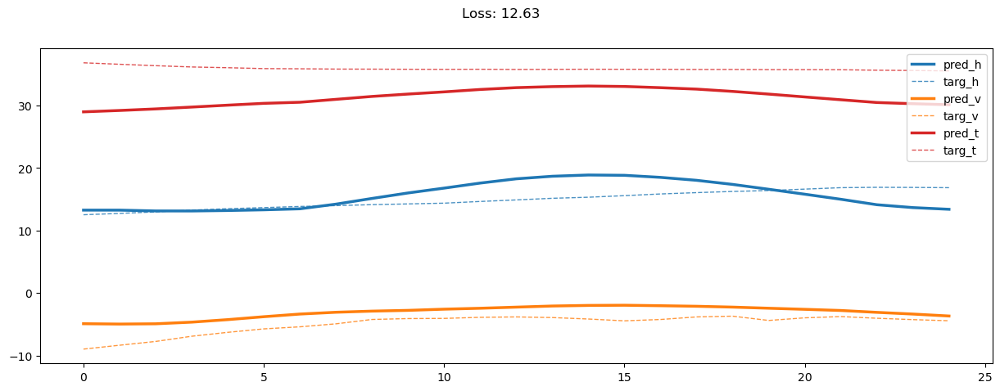

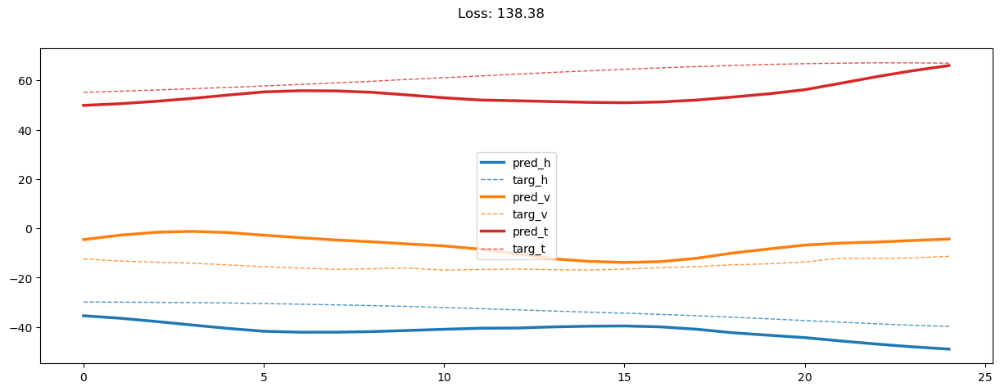

01400: train loss:  276.670, imu loss:  0.139, mag loss:  86.041, div loss:  170.850, t_lim: ( 4.941,  5.954), h_lim: ( 13.939,  13.939)
       valid loss:  204.227, imu loss:  0.106, mag loss:  89.313, div loss:  95.421, t_lim: ( 3.987,  5.514), h_lim: ( 14.255,  14.255)
01420: train loss:  273.442, imu loss:  0.139, mag loss:  85.049, div loss:  168.604, t_lim: ( 4.884,  5.899), h_lim: ( 14.006,  14.006)
       valid loss:  202.274, imu loss:  0.106, mag loss:  88.496, div loss:  94.393, t_lim: ( 3.869,  5.399), h_lim: ( 14.262,  14.262)
01440: train loss:  271.614, imu loss:  0.139, mag loss:  83.695, div loss:  168.263, t_lim: ( 4.820,  5.824), h_lim: ( 13.945,  13.945)
       valid loss:  200.337, imu loss:  0.106, mag loss:  87.273, div loss:  93.653, t_lim: ( 3.862,  5.418), h_lim: ( 14.276,  14.276)
01460: train loss:  264.219, imu loss:  0.139, mag loss:  81.471, div loss:  163.137, t_lim: ( 4.738,  5.762), h_lim: ( 13.966,  13.966)
       valid loss:  197.539, imu loss:  0.10

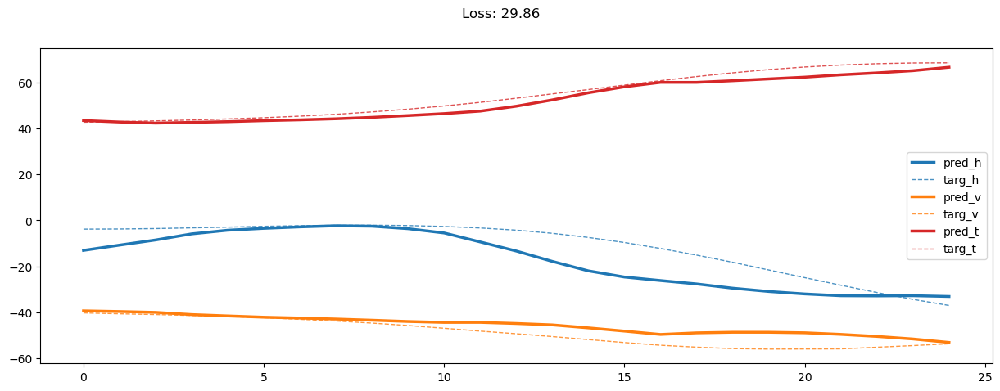

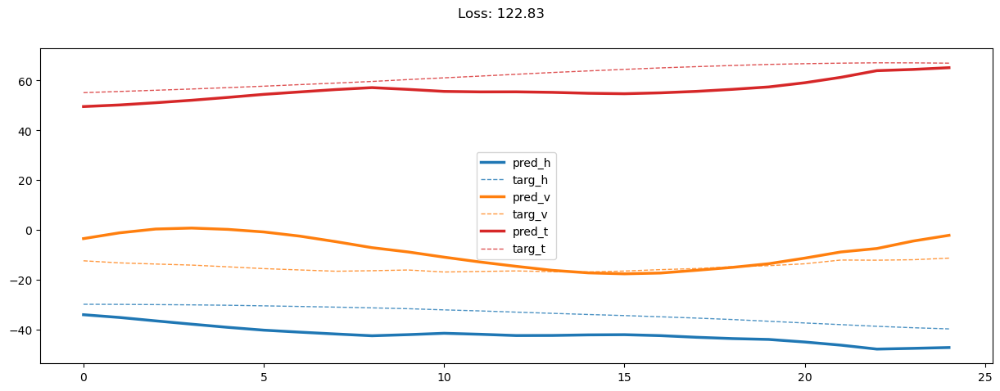

01600: train loss:  245.049, imu loss:  0.139, mag loss:  75.001, div loss:  150.726, t_lim: ( 4.473,  5.510), h_lim: ( 13.932,  13.932)
       valid loss:  187.871, imu loss:  0.106, mag loss:  80.264, div loss:  88.724, t_lim: ( 3.474,  5.215), h_lim: ( 13.997,  13.997)
01620: train loss:  244.214, imu loss:  0.140, mag loss:  74.950, div loss:  150.054, t_lim: ( 4.448,  5.488), h_lim: ( 13.843,  13.843)
       valid loss:  187.627, imu loss:  0.106, mag loss:  80.191, div loss:  88.597, t_lim: ( 3.393,  5.141), h_lim: ( 14.028,  14.028)
01640: train loss:  240.141, imu loss:  0.139, mag loss:  74.097, div loss:  146.917, t_lim: ( 4.406,  5.435), h_lim: ( 13.810,  13.810)
       valid loss:  186.903, imu loss:  0.106, mag loss:  80.076, div loss:  88.101, t_lim: ( 3.377,  5.158), h_lim: ( 13.907,  13.907)
01660: train loss:  237.828, imu loss:  0.139, mag loss:  73.365, div loss:  145.316, t_lim: ( 4.422,  5.408), h_lim: ( 13.847,  13.847)
       valid loss:  186.062, imu loss:  0.10

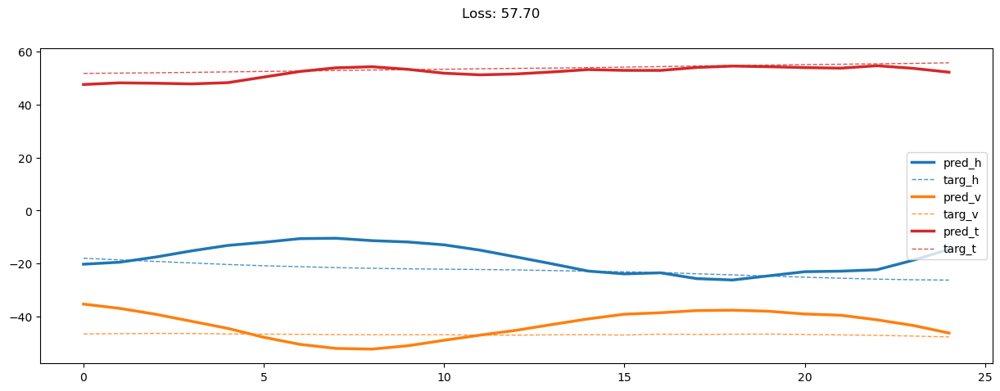

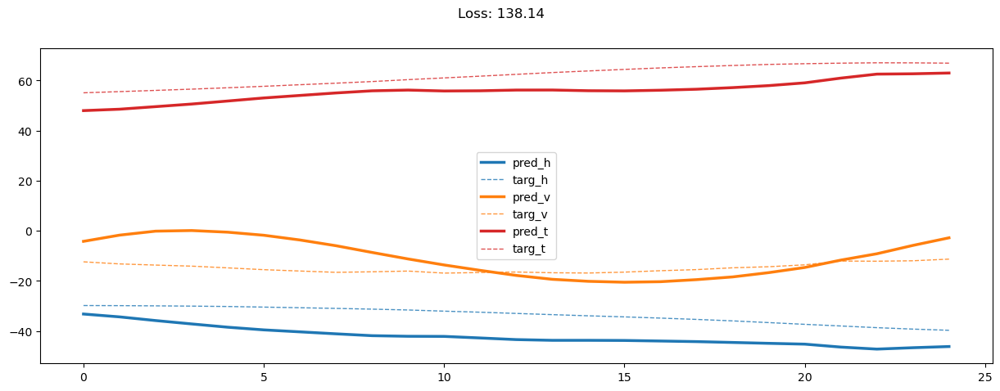

01800: train loss:  226.093, imu loss:  0.139, mag loss:  68.999, div loss:  138.266, t_lim: ( 4.196,  5.210), h_lim: ( 13.732,  13.732)
       valid loss:  181.420, imu loss:  0.106, mag loss:  76.319, div loss:  86.642, t_lim: ( 3.308,  5.018), h_lim: ( 13.762,  13.762)
01820: train loss:  220.700, imu loss:  0.138, mag loss:  67.975, div loss:  133.924, t_lim: ( 4.209,  5.205), h_lim: ( 13.707,  13.707)
       valid loss:  182.994, imu loss:  0.106, mag loss:  77.681, div loss:  86.749, t_lim: ( 3.310,  4.988), h_lim: ( 13.889,  13.889)
01840: train loss:  222.060, imu loss:  0.139, mag loss:  67.822, div loss:  135.516, t_lim: ( 4.149,  5.168), h_lim: ( 13.670,  13.670)
       valid loss:  181.126, imu loss:  0.106, mag loss:  76.193, div loss:  86.508, t_lim: ( 3.291,  4.971), h_lim: ( 13.768,  13.768)
01860: train loss:  220.736, imu loss:  0.139, mag loss:  67.339, div loss:  134.712, t_lim: ( 4.112,  5.098), h_lim: ( 13.694,  13.694)
       valid loss:  180.254, imu loss:  0.10

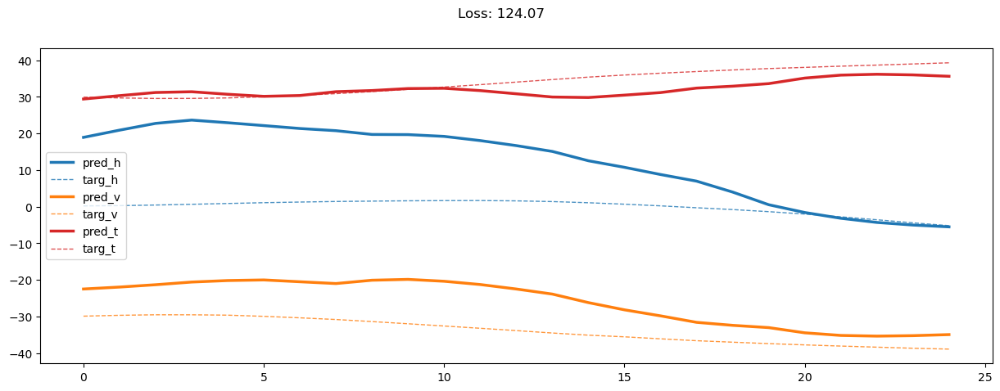

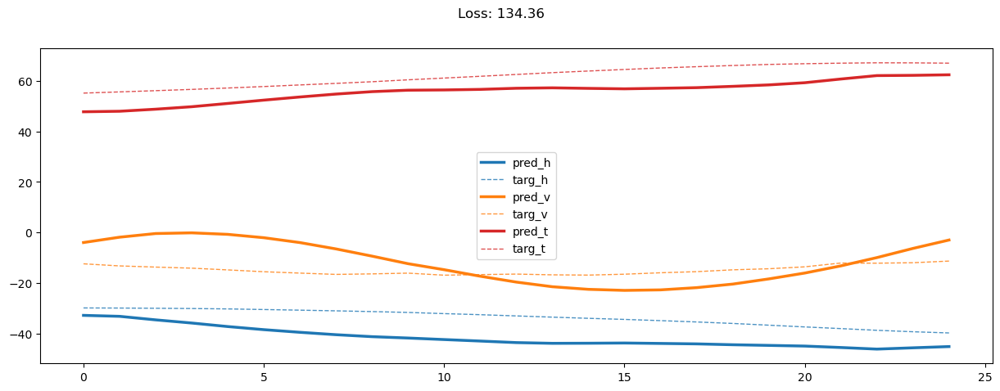

02000: train loss:  211.462, imu loss:  0.139, mag loss:  64.195, div loss:  128.783, t_lim: ( 3.991,  4.979), h_lim: ( 13.613,  13.613)
       valid loss:  180.013, imu loss:  0.105, mag loss:  75.655, div loss:  86.131, t_lim: ( 3.200,  4.837), h_lim: ( 13.695,  13.695)
02020: train loss:  210.744, imu loss:  0.138, mag loss:  64.241, div loss:  127.986, t_lim: ( 4.009,  4.973), h_lim: ( 13.647,  13.647)
       valid loss:  179.148, imu loss:  0.105, mag loss:  74.928, div loss:  86.124, t_lim: ( 3.176,  4.837), h_lim: ( 13.568,  13.568)
02040: train loss:  209.952, imu loss:  0.138, mag loss:  63.922, div loss:  127.511, t_lim: ( 3.898,  4.917), h_lim: ( 13.718,  13.718)
       valid loss:  177.867, imu loss:  0.105, mag loss:  74.524, div loss:  85.215, t_lim: ( 3.184,  4.817), h_lim: ( 13.614,  13.614)
02060: train loss:  206.702, imu loss:  0.139, mag loss:  63.047, div loss:  125.192, t_lim: ( 3.891,  4.908), h_lim: ( 13.671,  13.671)
       valid loss:  178.279, imu loss:  0.10

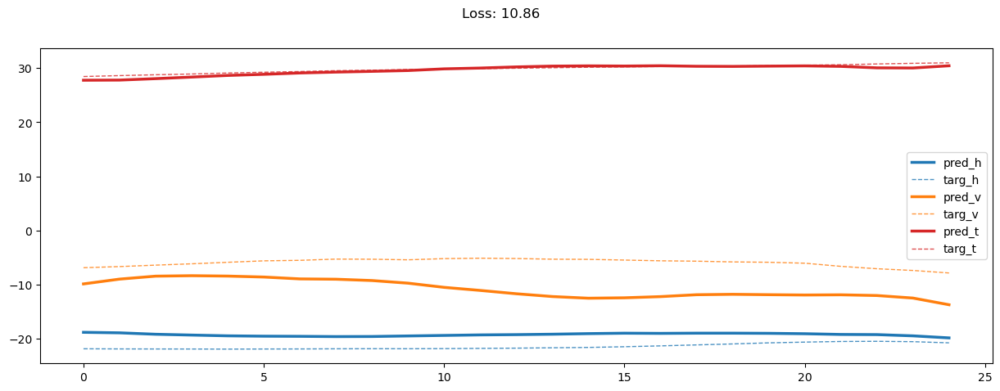

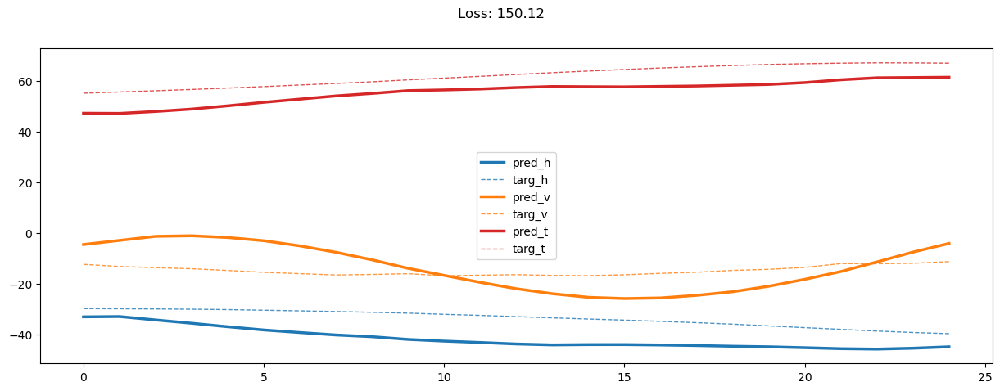

02200: train loss:  201.930, imu loss:  0.138, mag loss:  61.359, div loss:  122.198, t_lim: ( 3.877,  4.822), h_lim: ( 13.649,  13.649)
       valid loss:  174.895, imu loss:  0.105, mag loss:  72.985, div loss:  83.839, t_lim: ( 3.195,  4.731), h_lim: ( 13.619,  13.619)
02220: train loss:  201.567, imu loss:  0.138, mag loss:  61.358, div loss:  121.864, t_lim: ( 3.877,  4.831), h_lim: ( 13.614,  13.614)
       valid loss:  175.283, imu loss:  0.105, mag loss:  73.136, div loss:  84.068, t_lim: ( 3.275,  4.760), h_lim: ( 13.585,  13.585)
02240: train loss:  201.327, imu loss:  0.138, mag loss:  60.621, div loss:  122.373, t_lim: ( 3.867,  4.807), h_lim: ( 13.623,  13.623)
       valid loss:  173.377, imu loss:  0.105, mag loss:  72.158, div loss:  83.130, t_lim: ( 3.182,  4.746), h_lim: ( 13.630,  13.630)
02260: train loss:  198.982, imu loss:  0.138, mag loss:  60.213, div loss:  120.425, t_lim: ( 3.798,  4.754), h_lim: ( 13.690,  13.690)
       valid loss:  175.200, imu loss:  0.10

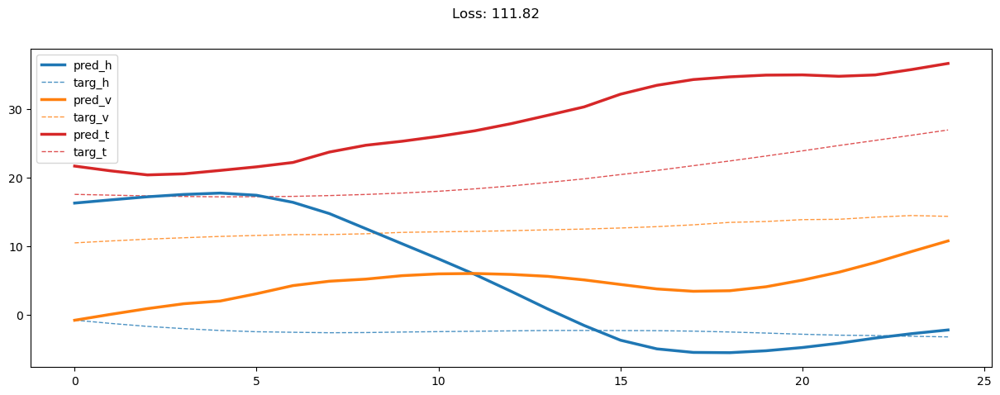

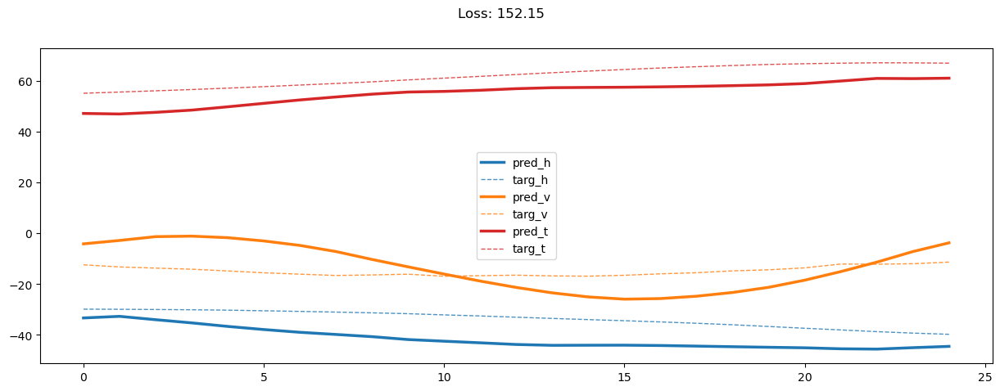

02400: train loss:  196.539, imu loss:  0.138, mag loss:  59.488, div loss:  118.811, t_lim: ( 3.780,  4.701), h_lim: ( 13.631,  13.631)
       valid loss:  171.788, imu loss:  0.104, mag loss:  71.279, div loss:  82.487, t_lim: ( 3.183,  4.690), h_lim: ( 13.604,  13.604)
02420: train loss:  194.527, imu loss:  0.138, mag loss:  59.015, div loss:  117.301, t_lim: ( 3.772,  4.704), h_lim: ( 13.601,  13.601)
       valid loss:  172.118, imu loss:  0.104, mag loss:  71.419, div loss:  82.663, t_lim: ( 3.238,  4.700), h_lim: ( 13.596,  13.596)
02440: train loss:  193.440, imu loss:  0.138, mag loss:  58.674, div loss:  116.516, t_lim: ( 3.751,  4.679), h_lim: ( 13.666,  13.666)
       valid loss:  174.164, imu loss:  0.104, mag loss:  72.960, div loss:  83.031, t_lim: ( 3.191,  4.719), h_lim: ( 13.732,  13.732)
02460: train loss:  193.423, imu loss:  0.138, mag loss:  58.189, div loss:  116.968, t_lim: ( 3.785,  4.672), h_lim: ( 13.677,  13.677)
       valid loss:  171.439, imu loss:  0.10

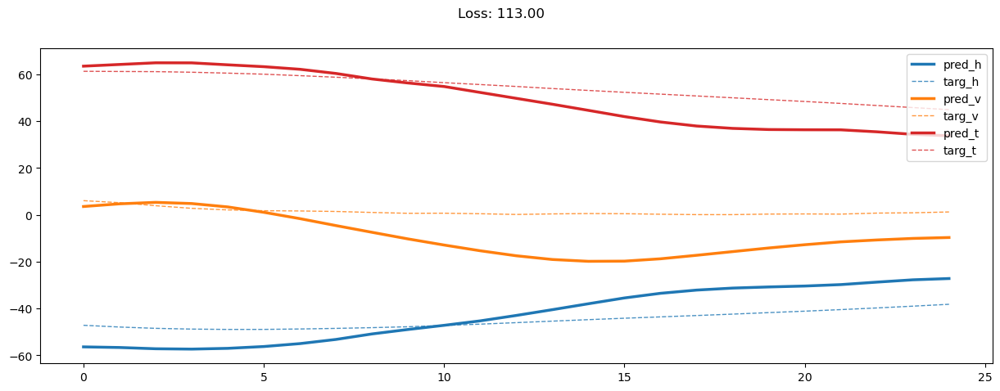

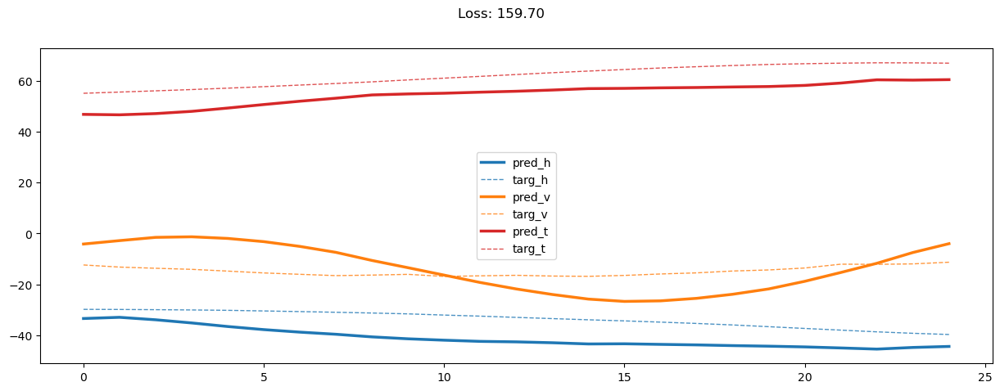

02600: train loss:  188.949, imu loss:  0.137, mag loss:  56.936, div loss:  113.922, t_lim: ( 3.740,  4.602), h_lim: ( 13.567,  13.567)
       valid loss:  170.614, imu loss:  0.104, mag loss:  70.752, div loss:  81.823, t_lim: ( 3.175,  4.734), h_lim: ( 13.591,  13.591)
02620: train loss:  190.653, imu loss:  0.137, mag loss:  57.719, div loss:  114.768, t_lim: ( 3.736,  4.631), h_lim: ( 13.622,  13.622)
       valid loss:  170.489, imu loss:  0.104, mag loss:  70.567, div loss:  81.940, t_lim: ( 3.226,  4.687), h_lim: ( 13.557,  13.557)
02640: train loss:  189.854, imu loss:  0.137, mag loss:  57.161, div loss:  114.497, t_lim: ( 3.704,  4.610), h_lim: ( 13.676,  13.676)
       valid loss:  169.873, imu loss:  0.104, mag loss:  70.298, div loss:  81.539, t_lim: ( 3.256,  4.699), h_lim: ( 13.594,  13.594)
02660: train loss:  188.868, imu loss:  0.137, mag loss:  56.965, div loss:  113.823, t_lim: ( 3.667,  4.578), h_lim: ( 13.593,  13.593)
       valid loss:  169.451, imu loss:  0.10

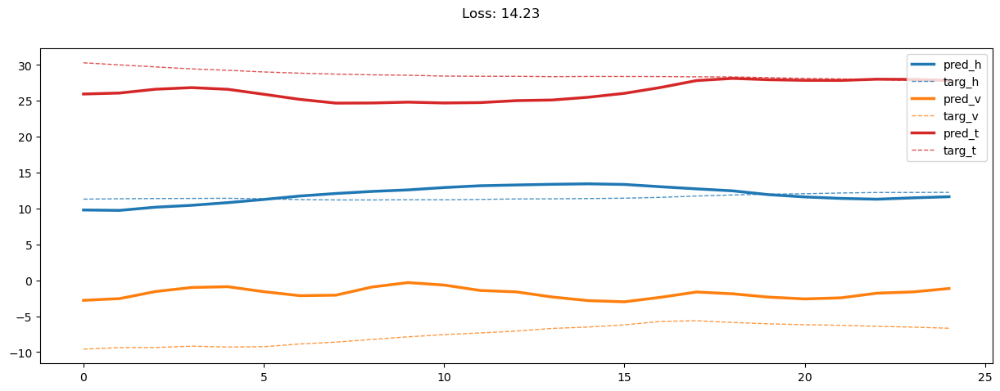

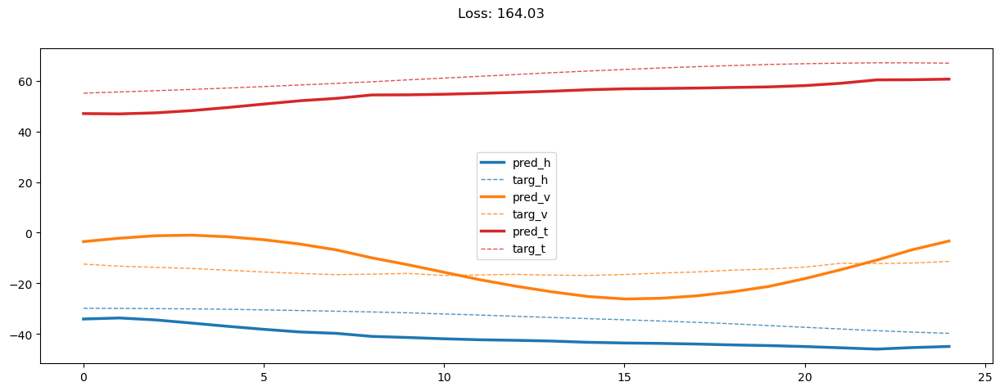

02800: train loss:  185.308, imu loss:  0.137, mag loss:  55.907, div loss:  111.312, t_lim: ( 3.660,  4.562), h_lim: ( 13.616,  13.616)
       valid loss:  167.879, imu loss:  0.103, mag loss:  69.255, div loss:  80.691, t_lim: ( 3.234,  4.678), h_lim: ( 13.513,  13.513)
02820: train loss:  185.576, imu loss:  0.137, mag loss:  56.003, div loss:  111.436, t_lim: ( 3.689,  4.551), h_lim: ( 13.664,  13.664)
       valid loss:  167.869, imu loss:  0.103, mag loss:  69.525, div loss:  80.393, t_lim: ( 3.276,  4.697), h_lim: ( 13.506,  13.506)
02840: train loss:  185.771, imu loss:  0.137, mag loss:  55.697, div loss:  111.967, t_lim: ( 3.689,  4.554), h_lim: ( 13.633,  13.633)
       valid loss:  167.720, imu loss:  0.103, mag loss:  69.235, div loss:  80.475, t_lim: ( 3.198,  4.656), h_lim: ( 13.616,  13.616)
02860: train loss:  185.422, imu loss:  0.138, mag loss:  55.595, div loss:  111.726, t_lim: ( 3.688,  4.555), h_lim: ( 13.624,  13.624)
       valid loss:  167.778, imu loss:  0.10

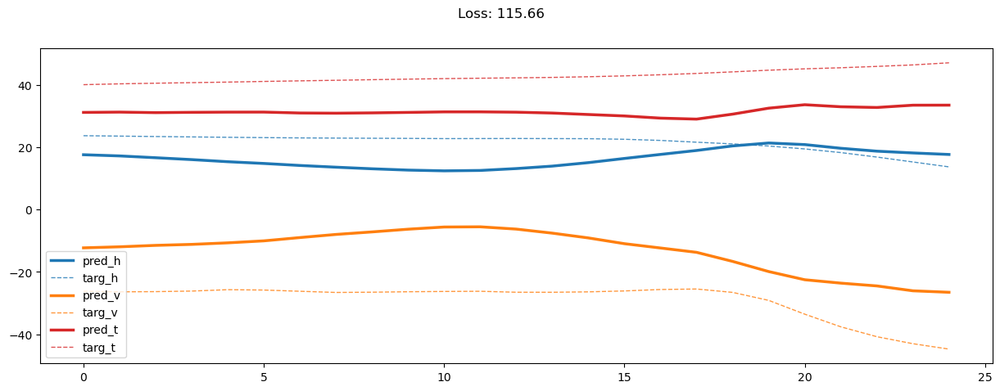

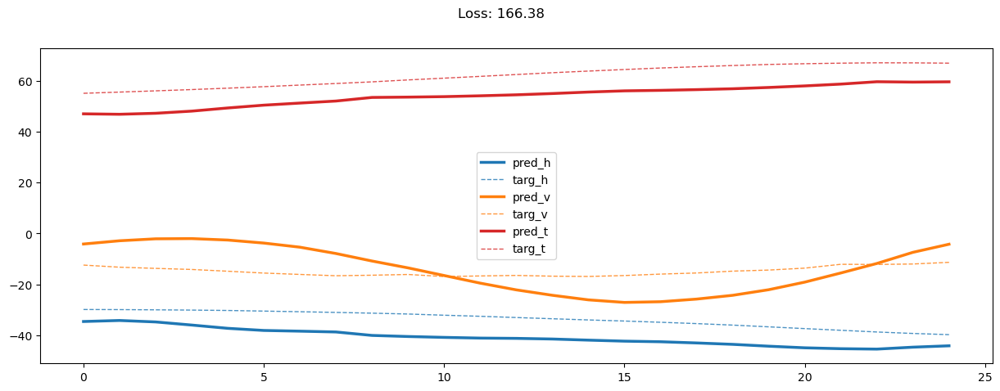

03000: train loss:  181.763, imu loss:  0.138, mag loss:  54.686, div loss:  108.999, t_lim: ( 3.660,  4.513), h_lim: ( 13.641,  13.641)
       valid loss:  167.199, imu loss:  0.103, mag loss:  68.809, div loss:  80.461, t_lim: ( 3.192,  4.654), h_lim: ( 13.537,  13.537)
03020: train loss:  180.913, imu loss:  0.138, mag loss:  54.424, div loss:  108.446, t_lim: ( 3.614,  4.507), h_lim: ( 13.622,  13.622)
       valid loss:  168.559, imu loss:  0.103, mag loss:  70.121, div loss:  80.459, t_lim: ( 3.226,  4.683), h_lim: ( 13.556,  13.556)
03040: train loss:  181.195, imu loss:  0.138, mag loss:  54.609, div loss:  108.542, t_lim: ( 3.613,  4.478), h_lim: ( 13.645,  13.645)
       valid loss:  166.030, imu loss:  0.103, mag loss:  68.498, div loss:  79.588, t_lim: ( 3.292,  4.678), h_lim: ( 13.509,  13.509)
03060: train loss:  180.791, imu loss:  0.137, mag loss:  54.171, div loss:  108.611, t_lim: ( 3.575,  4.460), h_lim: ( 13.634,  13.634)
       valid loss:  165.732, imu loss:  0.10

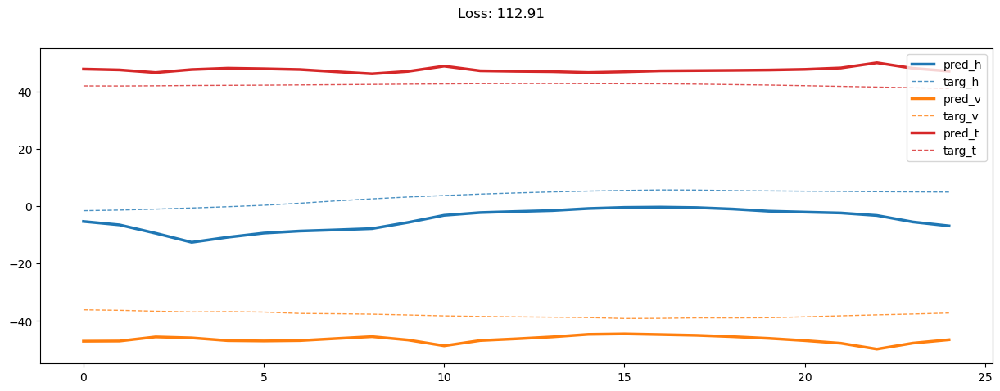

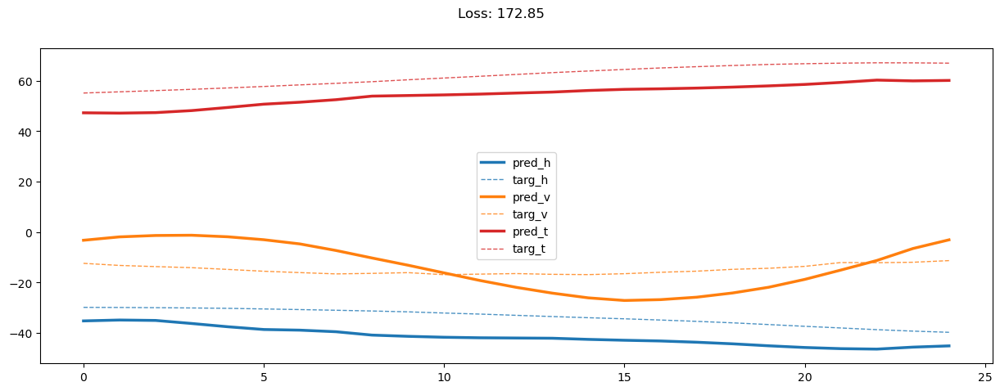

03200: train loss:  178.451, imu loss:  0.137, mag loss:  53.722, div loss:  106.747, t_lim: ( 3.571,  4.421), h_lim: ( 13.636,  13.636)
       valid loss:  166.207, imu loss:  0.103, mag loss:  68.581, div loss:  79.714, t_lim: ( 3.228,  4.655), h_lim: ( 13.512,  13.512)
03220: train loss:  179.000, imu loss:  0.137, mag loss:  53.516, div loss:  107.485, t_lim: ( 3.566,  4.426), h_lim: ( 13.651,  13.651)
       valid loss:  165.123, imu loss:  0.103, mag loss:  68.092, div loss:  79.070, t_lim: ( 3.318,  4.668), h_lim: ( 13.528,  13.528)
03240: train loss:  177.982, imu loss:  0.138, mag loss:  53.484, div loss:  106.531, t_lim: ( 3.585,  4.445), h_lim: ( 13.600,  13.600)
       valid loss:  166.395, imu loss:  0.103, mag loss:  68.919, div loss:  79.506, t_lim: ( 3.248,  4.696), h_lim: ( 13.534,  13.534)
03260: train loss:  178.049, imu loss:  0.137, mag loss:  53.624, div loss:  106.442, t_lim: ( 3.611,  4.441), h_lim: ( 13.613,  13.613)
       valid loss:  165.644, imu loss:  0.10

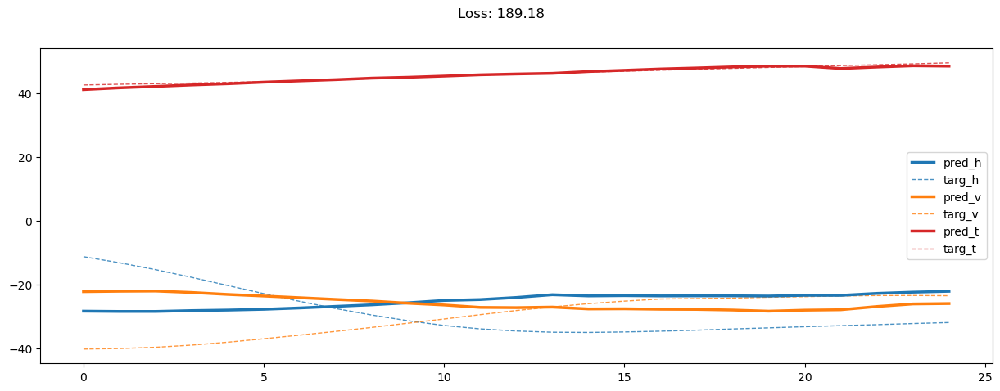

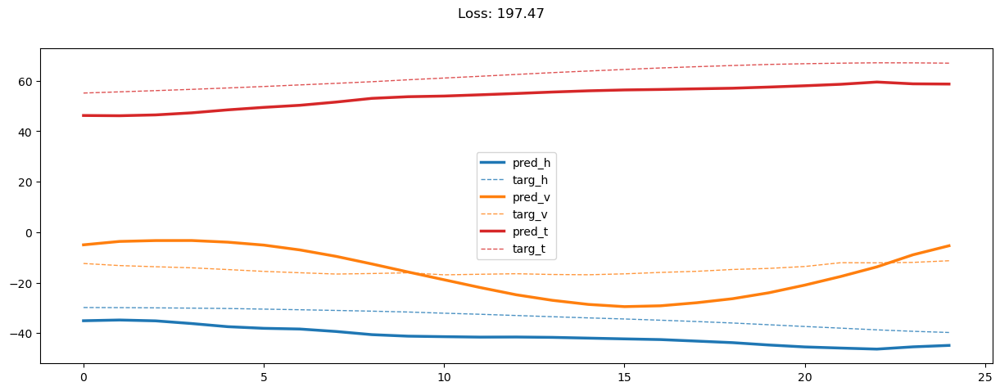

03400: train loss:  175.988, imu loss:  0.137, mag loss:  52.535, div loss:  105.522, t_lim: ( 3.627,  4.412), h_lim: ( 13.578,  13.578)
       valid loss:  165.514, imu loss:  0.103, mag loss:  68.158, div loss:  79.468, t_lim: ( 3.258,  4.686), h_lim: ( 13.455,  13.455)
03420: train loss:  175.453, imu loss:  0.136, mag loss:  52.421, div loss:  105.102, t_lim: ( 3.570,  4.411), h_lim: ( 13.593,  13.593)
       valid loss:  166.467, imu loss:  0.103, mag loss:  69.005, div loss:  79.473, t_lim: ( 3.186,  4.676), h_lim: ( 13.582,  13.582)
03440: train loss:  174.606, imu loss:  0.136, mag loss:  52.281, div loss:  104.380, t_lim: ( 3.575,  4.409), h_lim: ( 13.609,  13.609)
       valid loss:  165.201, imu loss:  0.103, mag loss:  67.838, div loss:  79.503, t_lim: ( 3.231,  4.652), h_lim: ( 13.460,  13.460)
03460: train loss:  175.536, imu loss:  0.136, mag loss:  52.361, div loss:  105.255, t_lim: ( 3.598,  4.444), h_lim: ( 13.552,  13.552)
       valid loss:  165.402, imu loss:  0.10

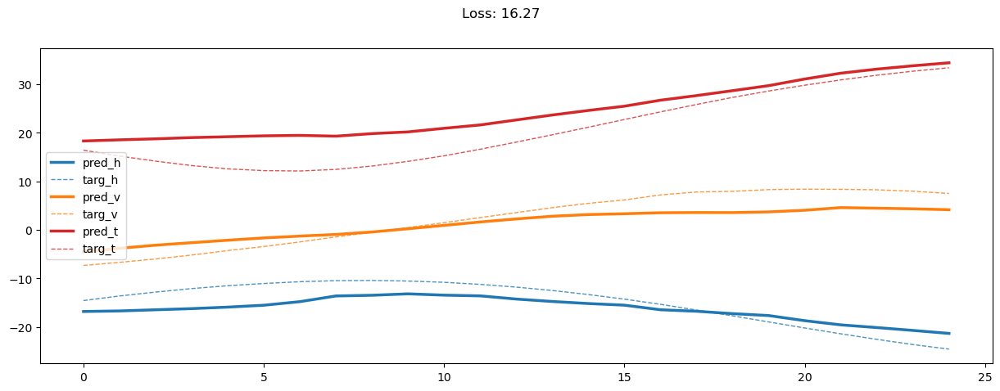

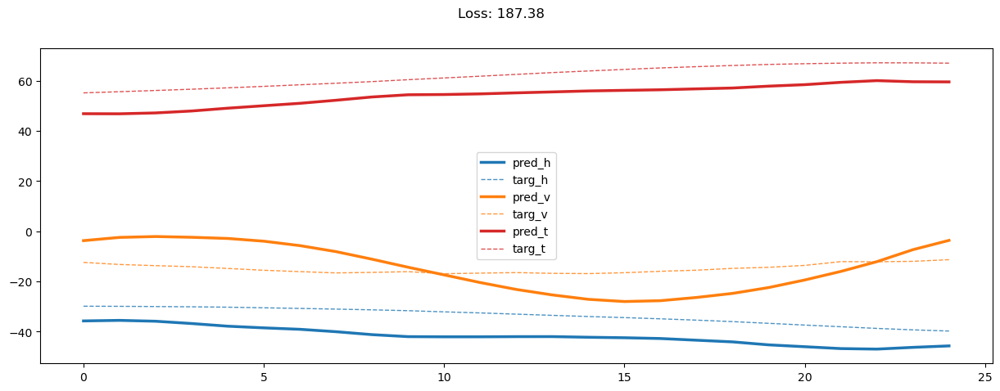

03600: train loss:  173.775, imu loss:  0.136, mag loss:  52.013, div loss:  103.841, t_lim: ( 3.578,  4.406), h_lim: ( 13.585,  13.585)
       valid loss:  164.186, imu loss:  0.103, mag loss:  67.586, div loss:  78.718, t_lim: ( 3.291,  4.688), h_lim: ( 13.441,  13.441)
03620: train loss:  173.251, imu loss:  0.137, mag loss:  51.849, div loss:  103.503, t_lim: ( 3.547,  4.373), h_lim: ( 13.596,  13.596)
       valid loss:  164.453, imu loss:  0.103, mag loss:  67.711, div loss:  78.782, t_lim: ( 3.219,  4.690), h_lim: ( 13.536,  13.536)
03640: train loss:  172.614, imu loss:  0.137, mag loss:  51.748, div loss:  102.959, t_lim: ( 3.540,  4.405), h_lim: ( 13.581,  13.581)
       valid loss:  163.403, imu loss:  0.103, mag loss:  66.940, div loss:  78.565, t_lim: ( 3.193,  4.609), h_lim: ( 13.540,  13.540)
03660: train loss:  170.921, imu loss:  0.136, mag loss:  51.252, div loss:  101.762, t_lim: ( 3.540,  4.378), h_lim: ( 13.602,  13.602)
       valid loss:  164.400, imu loss:  0.10

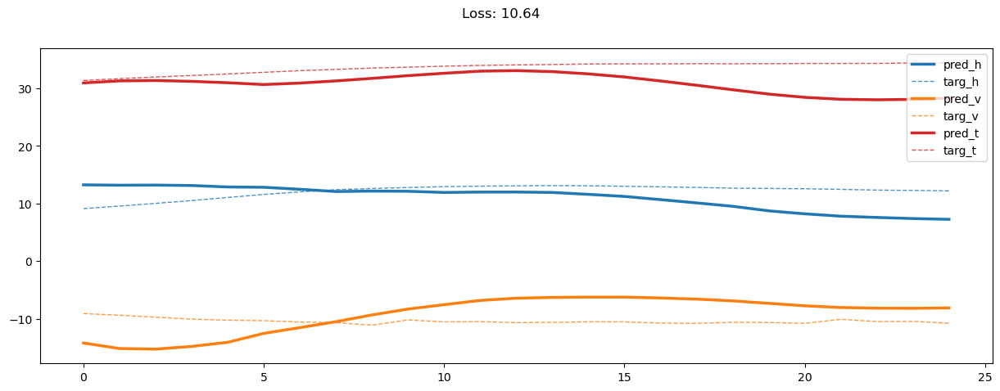

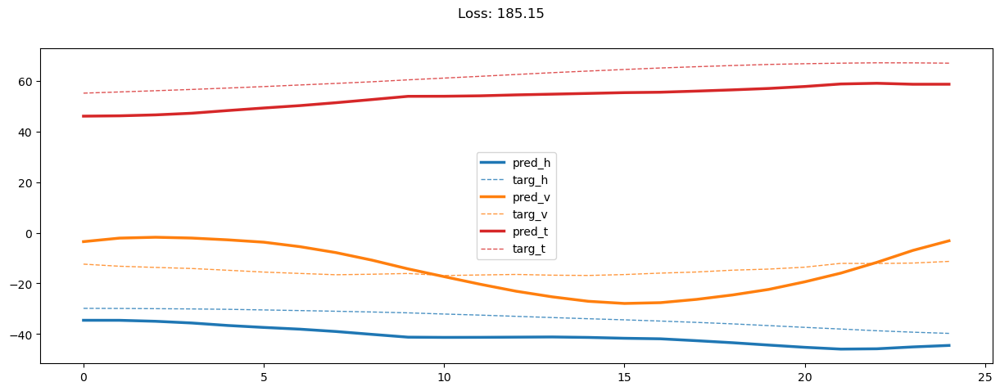

03800: train loss:  169.853, imu loss:  0.136, mag loss:  51.042, div loss:  100.907, t_lim: ( 3.530,  4.360), h_lim: ( 13.615,  13.615)
       valid loss:  163.574, imu loss:  0.103, mag loss:  67.342, div loss:  78.421, t_lim: ( 3.236,  4.671), h_lim: ( 13.396,  13.396)
03820: train loss:  170.143, imu loss:  0.137, mag loss:  50.779, div loss:  101.544, t_lim: ( 3.511,  4.350), h_lim: ( 13.543,  13.543)
       valid loss:  164.231, imu loss:  0.103, mag loss:  67.751, div loss:  78.521, t_lim: ( 3.263,  4.663), h_lim: ( 13.544,  13.544)
03840: train loss:  171.278, imu loss:  0.135, mag loss:  51.217, div loss:  102.143, t_lim: ( 3.566,  4.343), h_lim: ( 13.633,  13.633)
       valid loss:  163.889, imu loss:  0.103, mag loss:  67.409, div loss:  78.618, t_lim: ( 3.258,  4.653), h_lim: ( 13.455,  13.455)
03860: train loss:  170.511, imu loss:  0.137, mag loss:  50.895, div loss:  101.739, t_lim: ( 3.481,  4.296), h_lim: ( 13.648,  13.648)
       valid loss:  163.518, imu loss:  0.10

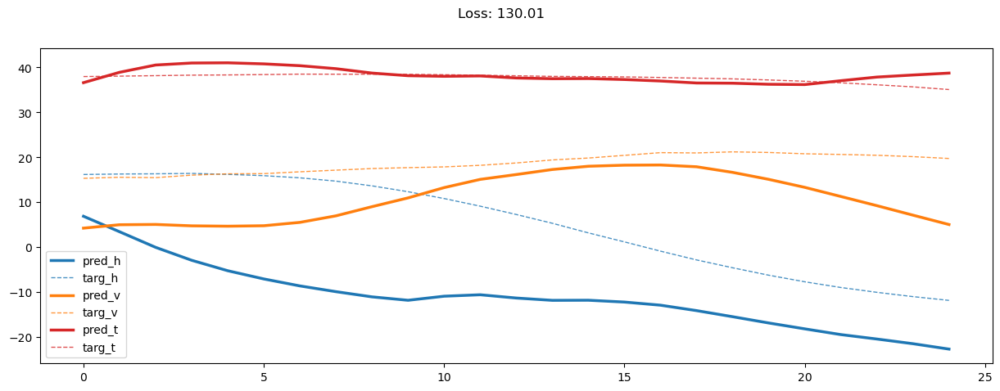

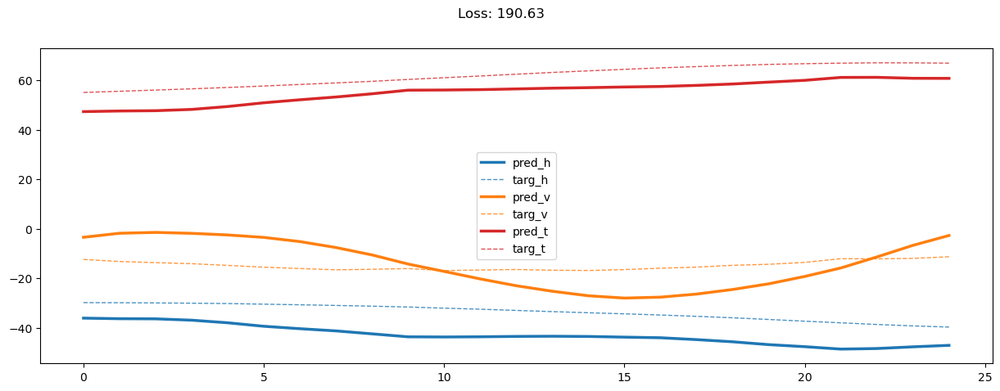

04000: train loss:  168.076, imu loss:  0.137, mag loss:  50.402, div loss:  99.842, t_lim: ( 3.511,  4.329), h_lim: ( 13.572,  13.572)
       valid loss:  162.865, imu loss:  0.102, mag loss:  67.099, div loss:  77.826, t_lim: ( 3.213,  4.595), h_lim: ( 13.588,  13.588)
04020: train loss:  168.558, imu loss:  0.136, mag loss:  50.474, div loss:  100.298, t_lim: ( 3.455,  4.291), h_lim: ( 13.568,  13.568)
       valid loss:  163.206, imu loss:  0.102, mag loss:  67.229, div loss:  78.080, t_lim: ( 3.277,  4.673), h_lim: ( 13.471,  13.471)
04040: train loss:  169.688, imu loss:  0.136, mag loss:  50.551, div loss:  101.278, t_lim: ( 3.543,  4.333), h_lim: ( 13.587,  13.587)
       valid loss:  162.516, imu loss:  0.102, mag loss:  66.609, div loss:  78.007, t_lim: ( 3.213,  4.621), h_lim: ( 13.529,  13.529)
04060: train loss:  168.861, imu loss:  0.137, mag loss:  50.305, div loss:  100.680, t_lim: ( 3.516,  4.336), h_lim: ( 13.608,  13.608)
       valid loss:  162.025, imu loss:  0.102

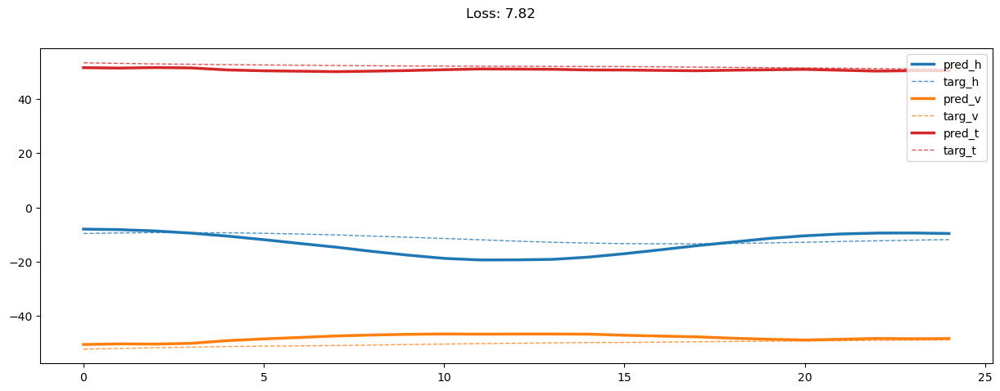

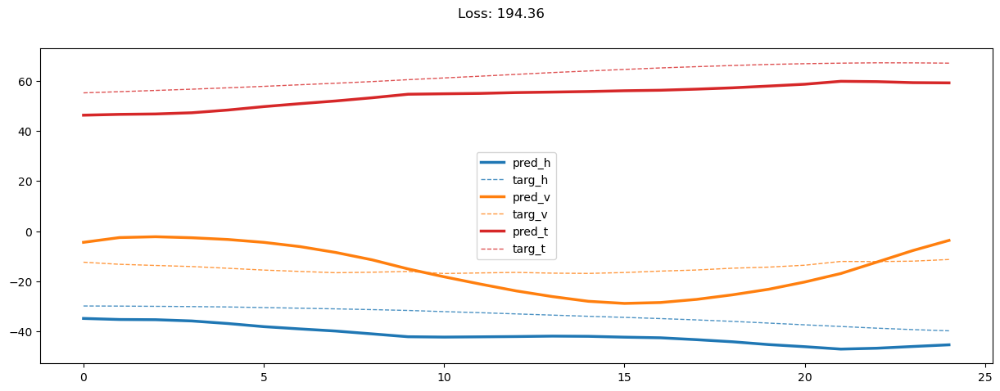

04200: train loss:  166.788, imu loss:  0.137, mag loss:  49.746, div loss:  99.151, t_lim: ( 3.532,  4.328), h_lim: ( 13.626,  13.626)
       valid loss:  163.012, imu loss:  0.102, mag loss:  67.133, div loss:  77.927, t_lim: ( 3.254,  4.636), h_lim: ( 13.559,  13.559)
04220: train loss:  166.241, imu loss:  0.135, mag loss:  49.517, div loss:  98.901, t_lim: ( 3.489,  4.308), h_lim: ( 13.585,  13.585)
       valid loss:  161.652, imu loss:  0.102, mag loss:  65.857, div loss:  77.892, t_lim: ( 3.223,  4.625), h_lim: ( 13.526,  13.526)
04240: train loss:  167.170, imu loss:  0.137, mag loss:  49.742, div loss:  99.615, t_lim: ( 3.462,  4.289), h_lim: ( 13.594,  13.594)
       valid loss:  162.531, imu loss:  0.102, mag loss:  66.871, div loss:  77.769, t_lim: ( 3.208,  4.622), h_lim: ( 13.520,  13.520)
04260: train loss:  166.352, imu loss:  0.136, mag loss:  49.634, div loss:  98.871, t_lim: ( 3.500,  4.299), h_lim: ( 13.612,  13.612)
       valid loss:  162.370, imu loss:  0.102, m

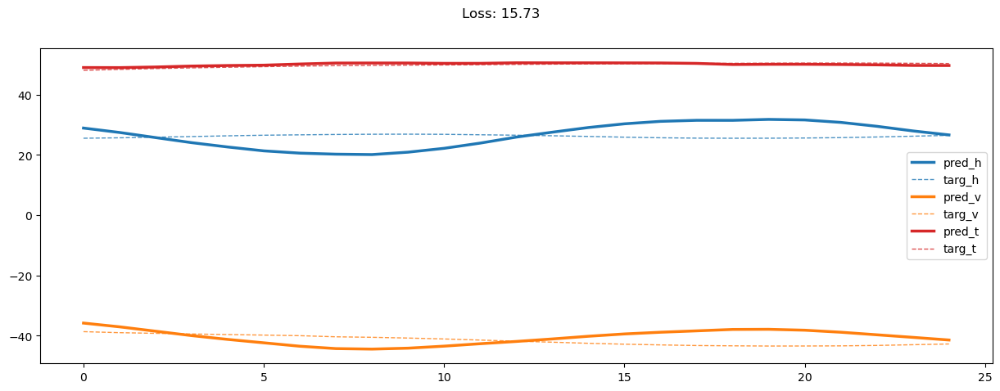

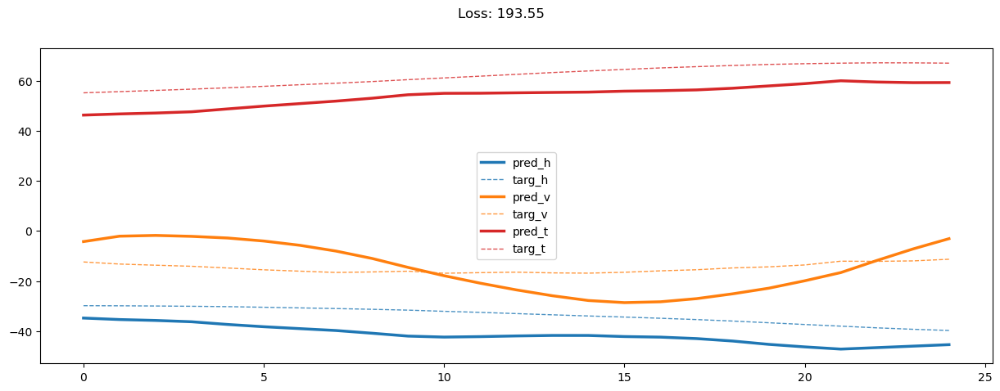

04400: train loss:  164.875, imu loss:  0.136, mag loss:  49.127, div loss:  97.930, t_lim: ( 3.488,  4.281), h_lim: ( 13.600,  13.600)
       valid loss:  162.101, imu loss:  0.102, mag loss:  66.607, div loss:  77.543, t_lim: ( 3.222,  4.624), h_lim: ( 13.575,  13.575)
04420: train loss:  164.115, imu loss:  0.136, mag loss:  49.077, div loss:  97.262, t_lim: ( 3.481,  4.259), h_lim: ( 13.574,  13.574)
       valid loss:  161.931, imu loss:  0.102, mag loss:  66.388, div loss:  77.654, t_lim: ( 3.250,  4.594), h_lim: ( 13.529,  13.529)
04440: train loss:  163.698, imu loss:  0.136, mag loss:  48.871, div loss:  97.022, t_lim: ( 3.521,  4.282), h_lim: ( 13.578,  13.578)
       valid loss:  161.912, imu loss:  0.102, mag loss:  66.496, div loss:  77.487, t_lim: ( 3.262,  4.582), h_lim: ( 13.575,  13.575)
04460: train loss:  165.149, imu loss:  0.137, mag loss:  49.427, div loss:  97.897, t_lim: ( 3.498,  4.305), h_lim: ( 13.586,  13.586)
       valid loss:  161.049, imu loss:  0.102, m

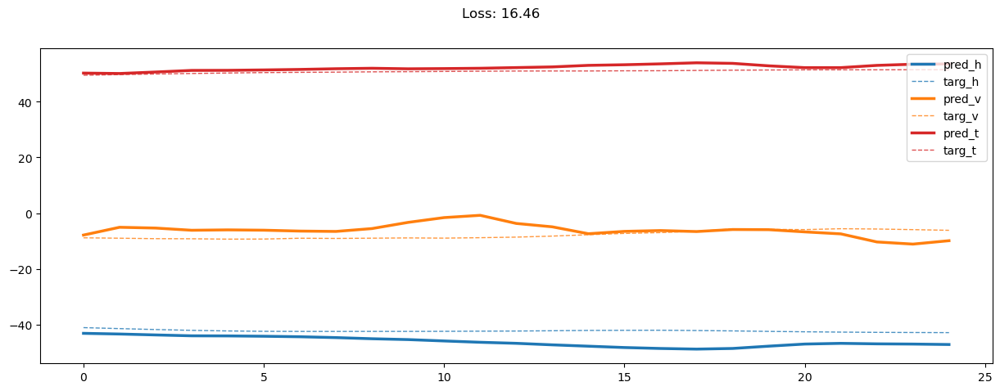

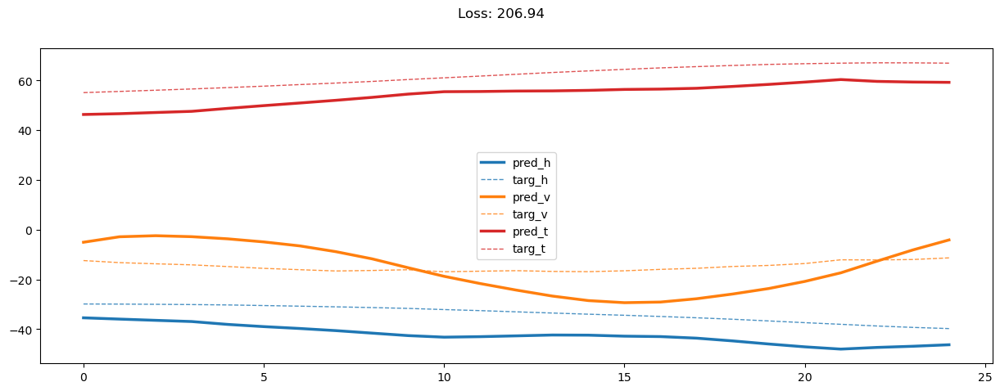

04600: train loss:  163.314, imu loss:  0.135, mag loss:  48.518, div loss:  96.975, t_lim: ( 3.494,  4.257), h_lim: ( 13.620,  13.620)
       valid loss:  160.985, imu loss:  0.102, mag loss:  65.887, div loss:  77.127, t_lim: ( 3.246,  4.577), h_lim: ( 13.625,  13.625)
04620: train loss:  163.579, imu loss:  0.136, mag loss:  48.559, div loss:  97.206, t_lim: ( 3.482,  4.250), h_lim: ( 13.620,  13.620)
       valid loss:  161.418, imu loss:  0.102, mag loss:  65.635, div loss:  77.857, t_lim: ( 3.183,  4.576), h_lim: ( 13.597,  13.597)
04640: train loss:  165.025, imu loss:  0.136, mag loss:  49.018, div loss:  98.202, t_lim: ( 3.503,  4.276), h_lim: ( 13.586,  13.586)
       valid loss:  160.926, imu loss:  0.102, mag loss:  65.665, div loss:  77.420, t_lim: ( 3.178,  4.570), h_lim: ( 13.516,  13.516)
04660: train loss:  163.255, imu loss:  0.136, mag loss:  48.553, div loss:  96.910, t_lim: ( 3.473,  4.261), h_lim: ( 13.593,  13.593)
       valid loss:  160.764, imu loss:  0.102, m

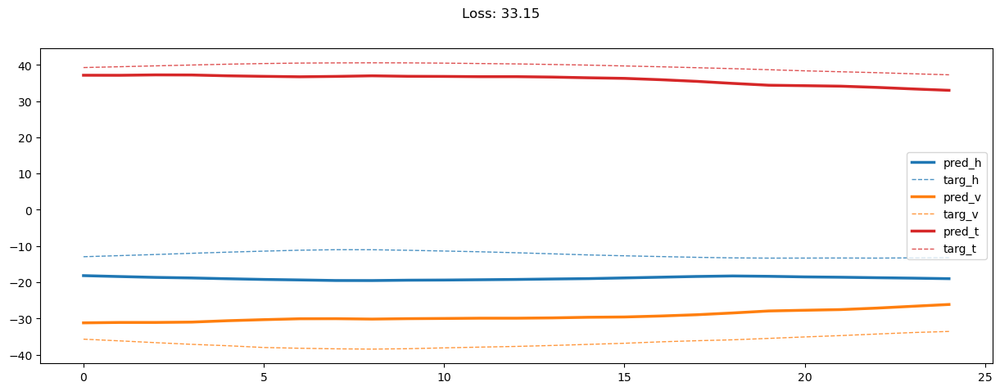

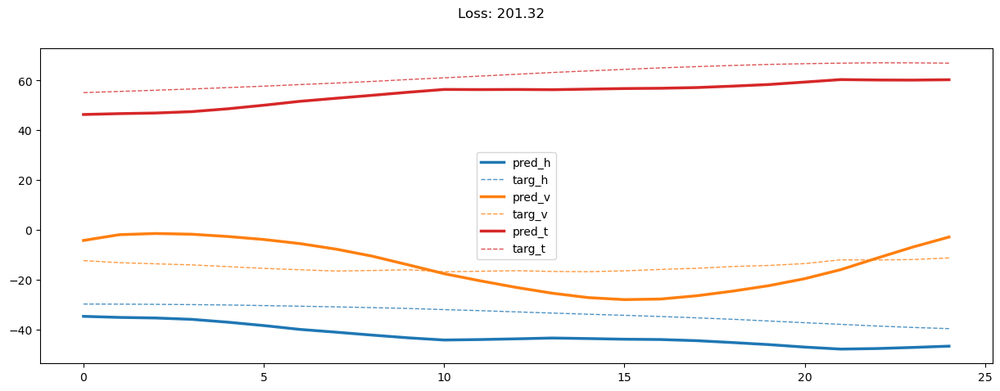

04800: train loss:  162.205, imu loss:  0.136, mag loss:  48.067, div loss:  96.413, t_lim: ( 3.445,  4.220), h_lim: ( 13.563,  13.563)
       valid loss:  161.478, imu loss:  0.102, mag loss:  66.023, div loss:  77.535, t_lim: ( 3.208,  4.552), h_lim: ( 13.602,  13.602)
04820: train loss:  162.449, imu loss:  0.136, mag loss:  48.277, div loss:  96.419, t_lim: ( 3.488,  4.256), h_lim: ( 13.553,  13.553)
       valid loss:  161.986, imu loss:  0.102, mag loss:  66.172, div loss:  77.923, t_lim: ( 3.231,  4.593), h_lim: ( 13.536,  13.536)
04840: train loss:  161.789, imu loss:  0.137, mag loss:  48.099, div loss:  95.880, t_lim: ( 3.499,  4.252), h_lim: ( 13.609,  13.609)
       valid loss:  162.280, imu loss:  0.102, mag loss:  66.877, div loss:  77.535, t_lim: ( 3.189,  4.587), h_lim: ( 13.529,  13.529)
04860: train loss:  161.042, imu loss:  0.135, mag loss:  47.712, div loss:  95.569, t_lim: ( 3.437,  4.222), h_lim: ( 13.600,  13.600)
       valid loss:  161.845, imu loss:  0.102, m

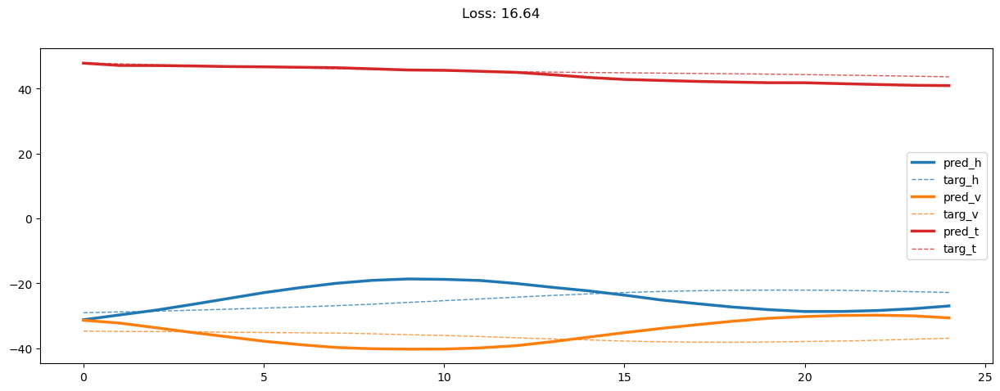

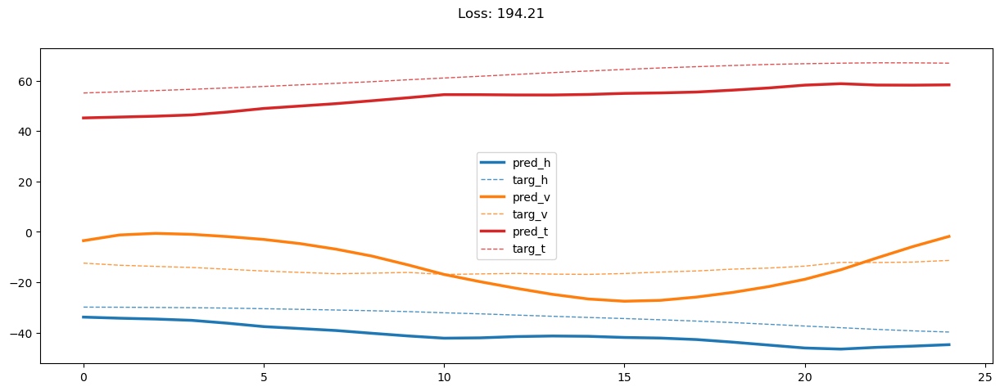

05000: train loss:  160.107, imu loss:  0.136, mag loss:  47.659, div loss:  94.717, t_lim: ( 3.476,  4.215), h_lim: ( 13.564,  13.564)
       valid loss:  161.179, imu loss:  0.101, mag loss:  65.793, div loss:  77.524, t_lim: ( 3.218,  4.603), h_lim: ( 13.504,  13.504)
05020: train loss:  160.850, imu loss:  0.136, mag loss:  47.764, div loss:  95.364, t_lim: ( 3.467,  4.221), h_lim: ( 13.553,  13.553)
       valid loss:  160.910, imu loss:  0.102, mag loss:  65.560, div loss:  77.463, t_lim: ( 3.214,  4.539), h_lim: ( 13.577,  13.577)
05040: train loss:  160.383, imu loss:  0.135, mag loss:  47.578, div loss:  95.100, t_lim: ( 3.424,  4.194), h_lim: ( 13.569,  13.569)
       valid loss:  161.248, imu loss:  0.102, mag loss:  65.713, div loss:  77.618, t_lim: ( 3.202,  4.556), h_lim: ( 13.597,  13.597)
05060: train loss:  160.761, imu loss:  0.135, mag loss:  47.810, div loss:  95.200, t_lim: ( 3.496,  4.240), h_lim: ( 13.563,  13.563)
       valid loss:  161.969, imu loss:  0.102, m

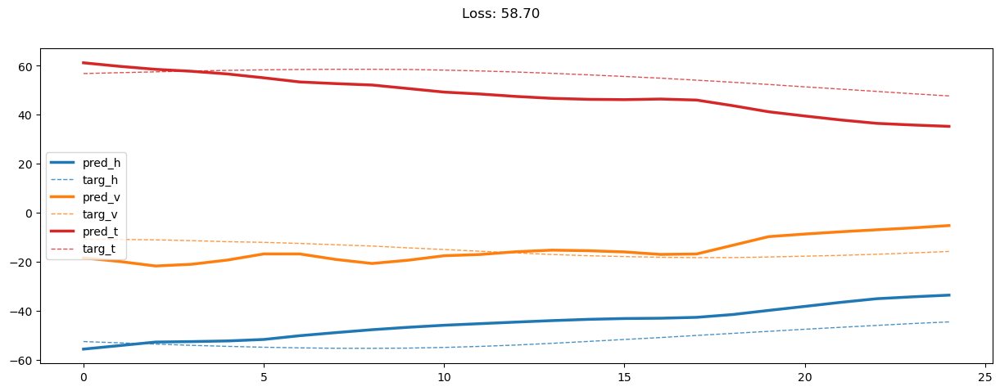

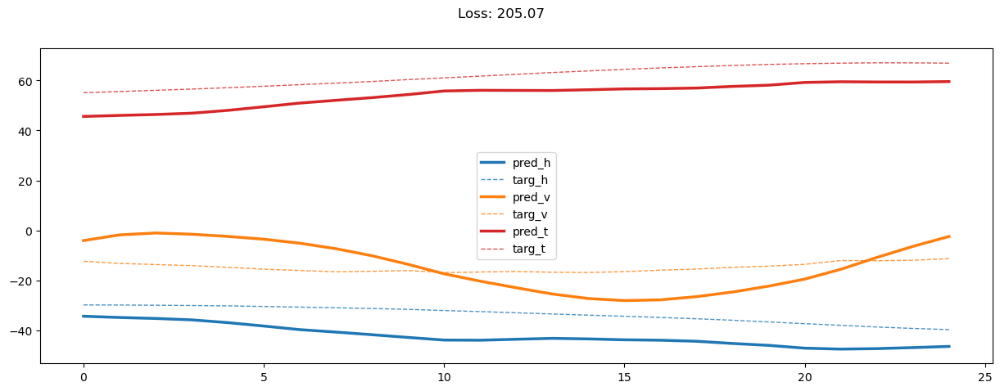

05200: train loss:  159.806, imu loss:  0.136, mag loss:  47.456, div loss:  94.643, t_lim: ( 3.492,  4.197), h_lim: ( 13.550,  13.550)
       valid loss:  160.721, imu loss:  0.101, mag loss:  65.391, div loss:  77.432, t_lim: ( 3.221,  4.529), h_lim: ( 13.595,  13.595)
05220: train loss:  158.861, imu loss:  0.135, mag loss:  47.180, div loss:  93.943, t_lim: ( 3.419,  4.198), h_lim: ( 13.600,  13.600)
       valid loss:  162.409, imu loss:  0.101, mag loss:  66.323, div loss:  78.083, t_lim: ( 3.310,  4.570), h_lim: ( 13.647,  13.647)
05240: train loss:  159.363, imu loss:  0.136, mag loss:  47.185, div loss:  94.447, t_lim: ( 3.463,  4.192), h_lim: ( 13.585,  13.585)
       valid loss:  162.337, imu loss:  0.101, mag loss:  66.255, div loss:  78.076, t_lim: ( 3.215,  4.561), h_lim: ( 13.680,  13.680)
05260: train loss:  159.304, imu loss:  0.136, mag loss:  47.241, div loss:  94.311, t_lim: ( 3.481,  4.198), h_lim: ( 13.596,  13.596)
       valid loss:  161.704, imu loss:  0.101, m

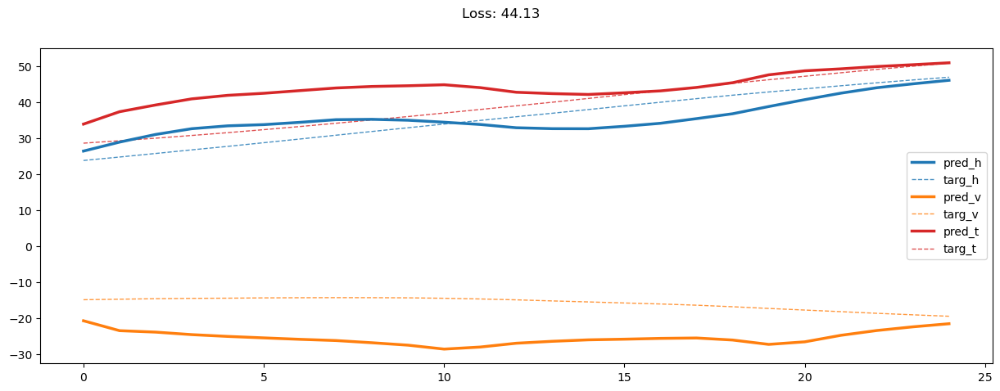

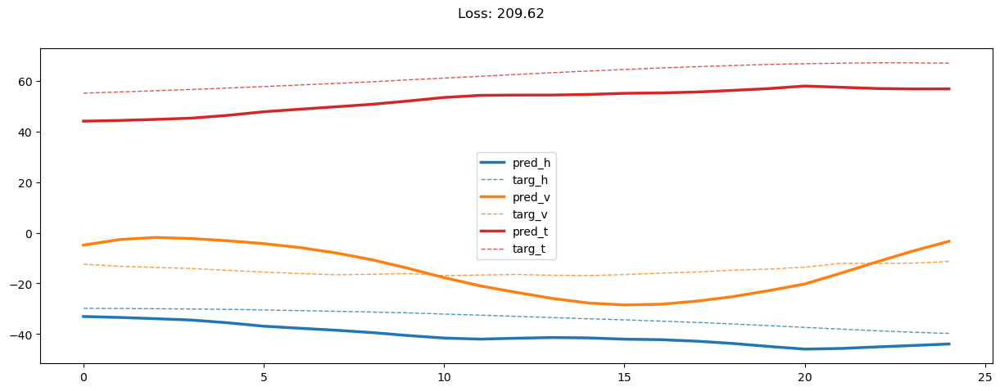

05400: train loss:  158.515, imu loss:  0.135, mag loss:  46.946, div loss:  93.874, t_lim: ( 3.454,  4.164), h_lim: ( 13.572,  13.572)
       valid loss:  162.637, imu loss:  0.101, mag loss:  66.182, div loss:  78.566, t_lim: ( 3.223,  4.596), h_lim: ( 13.535,  13.535)
05420: train loss:  157.716, imu loss:  0.135, mag loss:  46.727, div loss:  93.286, t_lim: ( 3.424,  4.138), h_lim: ( 13.608,  13.608)
       valid loss:  161.317, imu loss:  0.101, mag loss:  65.552, div loss:  77.851, t_lim: ( 3.244,  4.564), h_lim: ( 13.579,  13.579)
05440: train loss:  158.583, imu loss:  0.135, mag loss:  46.944, div loss:  93.946, t_lim: ( 3.427,  4.184), h_lim: ( 13.562,  13.562)
       valid loss:  161.774, imu loss:  0.101, mag loss:  65.614, div loss:  78.229, t_lim: ( 3.154,  4.545), h_lim: ( 13.633,  13.633)
05460: train loss:  158.636, imu loss:  0.135, mag loss:  46.971, div loss:  93.992, t_lim: ( 3.442,  4.179), h_lim: ( 13.544,  13.544)
       valid loss:  162.307, imu loss:  0.101, m

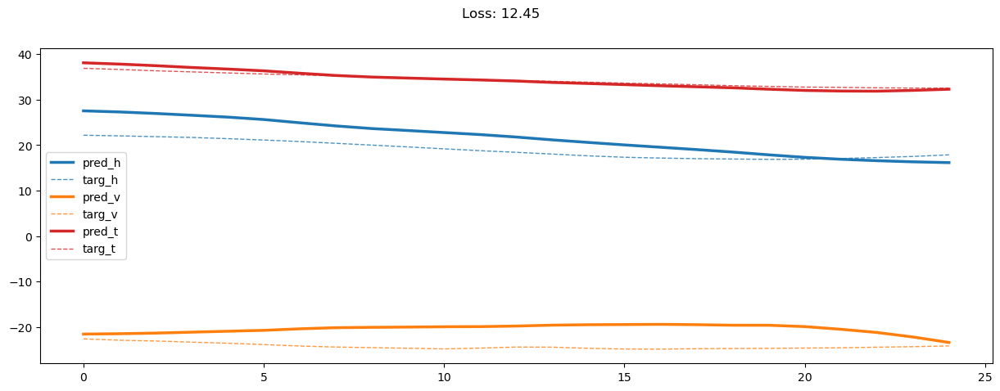

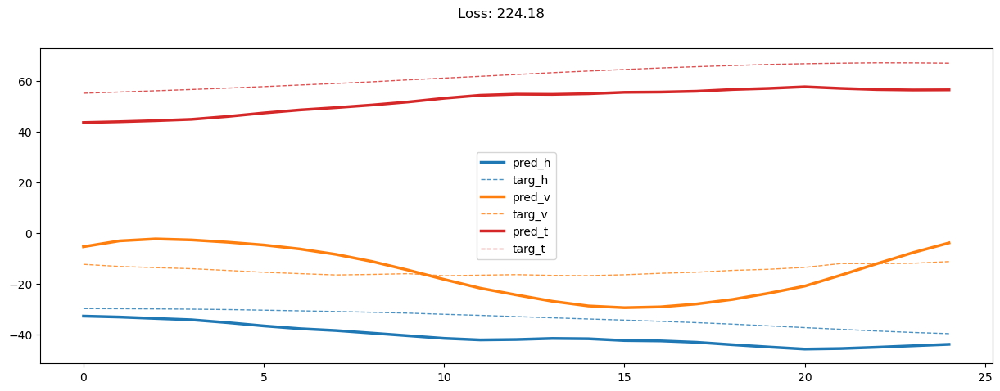

05600: train loss:  155.366, imu loss:  0.134, mag loss:  46.080, div loss:  91.631, t_lim: ( 3.448,  4.151), h_lim: ( 13.546,  13.546)
       valid loss:  162.385, imu loss:  0.101, mag loss:  66.181, div loss:  78.246, t_lim: ( 3.237,  4.596), h_lim: ( 13.601,  13.601)
05620: train loss:  157.118, imu loss:  0.135, mag loss:  46.337, div loss:  93.134, t_lim: ( 3.423,  4.156), h_lim: ( 13.538,  13.538)
       valid loss:  162.501, imu loss:  0.101, mag loss:  66.045, div loss:  78.416, t_lim: ( 3.203,  4.553), h_lim: ( 13.723,  13.723)
05640: train loss:  157.339, imu loss:  0.135, mag loss:  46.349, div loss:  93.253, t_lim: ( 3.445,  4.166), h_lim: ( 13.616,  13.616)
       valid loss:  162.893, imu loss:  0.101, mag loss:  66.226, div loss:  78.708, t_lim: ( 3.241,  4.580), h_lim: ( 13.613,  13.613)
05660: train loss:  156.092, imu loss:  0.135, mag loss:  46.231, div loss:  92.206, t_lim: ( 3.450,  4.142), h_lim: ( 13.551,  13.551)
       valid loss:  163.369, imu loss:  0.101, m

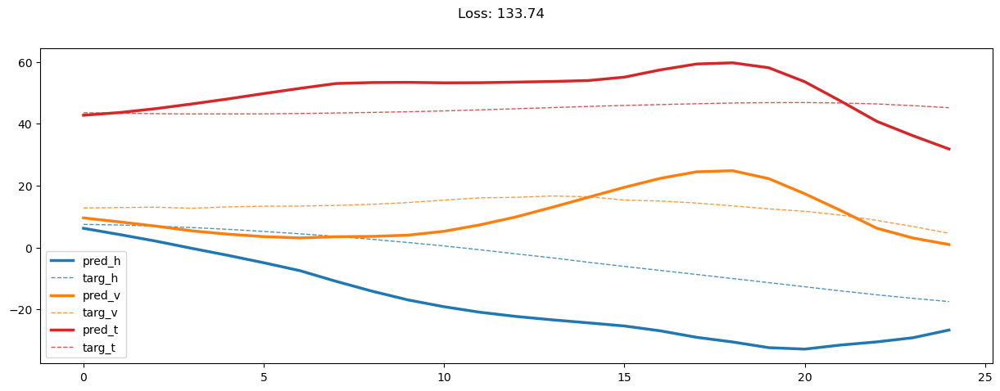

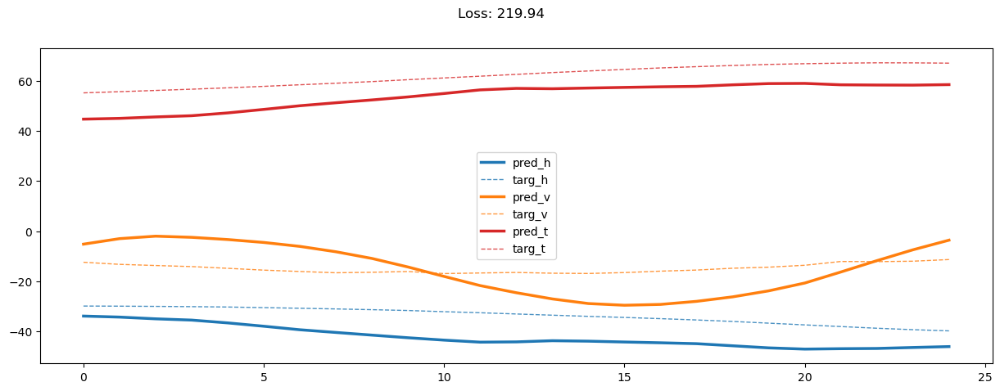

05800: train loss:  154.495, imu loss:  0.135, mag loss:  45.864, div loss:  90.971, t_lim: ( 3.425,  4.114), h_lim: ( 13.583,  13.583)
       valid loss:  161.673, imu loss:  0.101, mag loss:  65.581, div loss:  78.203, t_lim: ( 3.242,  4.532), h_lim: ( 13.579,  13.579)
05820: train loss:  156.124, imu loss:  0.135, mag loss:  46.281, div loss:  92.138, t_lim: ( 3.429,  4.132), h_lim: ( 13.614,  13.614)
       valid loss:  163.842, imu loss:  0.101, mag loss:  66.749, div loss:  79.078, t_lim: ( 3.146,  4.569), h_lim: ( 13.701,  13.701)
05840: train loss:  154.796, imu loss:  0.135, mag loss:  45.863, div loss:  91.271, t_lim: ( 3.415,  4.120), h_lim: ( 13.583,  13.583)
       valid loss:  163.179, imu loss:  0.100, mag loss:  66.570, div loss:  78.633, t_lim: ( 3.211,  4.557), h_lim: ( 13.655,  13.655)
05860: train loss:  156.188, imu loss:  0.135, mag loss:  46.075, div loss:  92.387, t_lim: ( 3.440,  4.135), h_lim: ( 13.630,  13.630)
       valid loss:  162.767, imu loss:  0.101, m

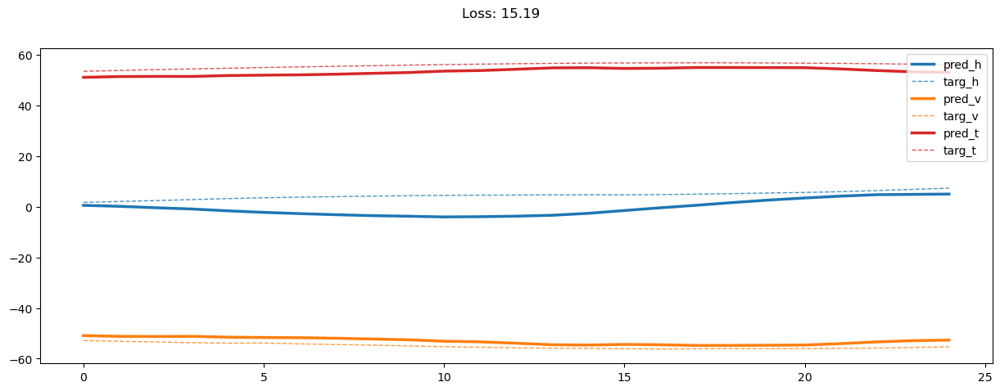

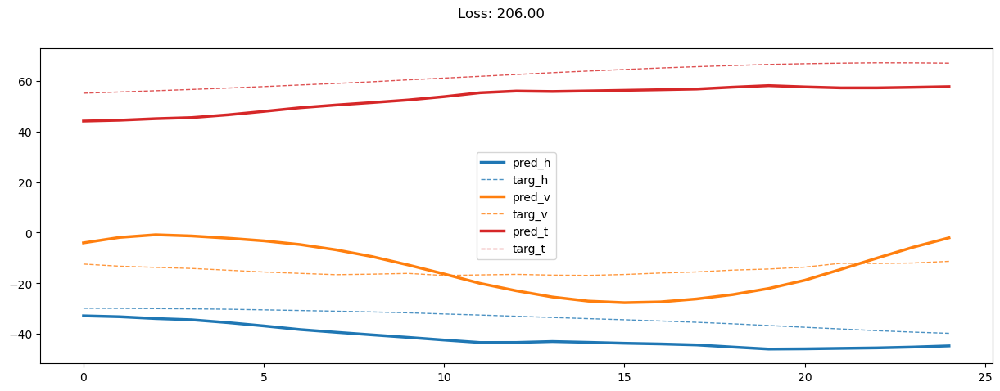

06000: train loss:  153.177, imu loss:  0.135, mag loss:  45.485, div loss:  90.068, t_lim: ( 3.393,  4.100), h_lim: ( 13.566,  13.566)
       valid loss:  164.179, imu loss:  0.100, mag loss:  66.652, div loss:  79.522, t_lim: ( 3.207,  4.575), h_lim: ( 13.672,  13.672)


In [34]:
draw = True

for epoch in range(6000):
    #####
    # 1. 用上半部訓練50epoch
    # 2. 隨機用上或下半部訓練Model
    # 3. 印出trajectory結果
    #####
    
    if (epoch + 1) % 200 == 0:
        draw = True
    
    train_loss, (train_imu_loss, train_mag_loss, t_d1_loss, t_magt_lim_loss, t_magh_lim_loss) = train(train_loader, draw)
    valid_loss, (valid_imu_loss, valid_mag_loss, v_d1_loss, v_magt_lim_loss, v_magh_lim_loss) = evalute(valid_loader, draw)
    
    draw = False
    
    if (epoch + 1) % 20 == 0:
        ep = str(epoch + 1).zfill(5)
        print(f'{ep:>5}: train loss: {train_loss: 2.3f}, imu loss: {train_imu_loss: 2.3f}, mag loss: {train_mag_loss: 2.3f}, div loss: {t_d1_loss: 2.3f}, t_lim: ({t_magt_lim_loss[0]: 2.3f}, {t_magt_lim_loss[1]: 2.3f}), h_lim: ({t_magh_lim_loss[0]: 2.3f}, {t_magh_lim_loss[1]: 2.3f})\n' +
              f'{"":>5}  valid loss: {valid_loss: 2.3f}, imu loss: {valid_imu_loss: 2.3f}, mag loss: {valid_mag_loss: 2.3f}, div loss: {v_d1_loss: 2.3f}, t_lim: ({v_magt_lim_loss[0]: 2.3f}, {v_magt_lim_loss[1]: 2.3f}), h_lim: ({v_magh_lim_loss[0]: 2.3f}, {v_magh_lim_loss[1]: 2.3f})')

In [42]:
def output_eval(model, dataloader):
    model.eval()
    
    results = []
    class_results = []
    class_labels = []
    
    with torch.no_grad():
        for source_data, source_label, target_data, target_label in dataloader:
            source_data = source_data.to(device)
            source_imu = source_data[:, :, :6]
            source_mag = source_data[:, :, 7:10]
            source_total_mag = source_data[:, :, 10]
            source_angle = source_data[:, :, 6]

            target_data = target_data.to(device)
            target_imu = target_data[:, :, :6]
            target_mag = target_data[:, :, 7:10]
            target_total_mag = target_data[:, :, 10]
            target_angle = source_data[:, :, 6]
            
            st_angle = torch.concat((source_angle[:, :, None], target_angle[:, :, None]), dim=-1)

            # generate mag
            source_pred_class, source_pred_one_hot = classifier.predict_label(source_imu)
            z_imu, predict_mag = model(source_imu, source_mag, source_pred_one_hot, st_angle)


            # generator loss
#             gen_loss, imu_loss, mag_loss = generator_loss(z_imu, target_imu, predict_mag, target_mag)

            # record loss
            predict_mag = predict_mag.detach().cpu().numpy()
            target_mag = target_mag.cpu().numpy()
            source_label = source_label.detach().cpu().numpy()
            
            results.extend(zip(predict_mag, target_mag, source_label))
            
            diff = np.power(predict_mag.reshape(len(predict_mag), -1, 3) - target_mag.reshape(len(target_mag), -1, 3), 2).mean(axis=1)
            class_results.extend(diff)
            class_labels.extend(source_label)
    
    return np.array(results, dtype=object), np.array(class_results), np.array(class_labels)

In [43]:
def plot_result(result):
    pred_mag = result[0].reshape(-1, 3)
    targ_mag = result[1].reshape(-1, 3)
    source_label = result[2]
    x = np.arange(len(pred_mag))
    
    loss = mse_loss(torch.tensor(pred_mag), torch.tensor(targ_mag)).item()
    
    fig = plt.figure(figsize=(15, 5))
    
    for pm, tm, caxis, color in zip(pred_mag.T, targ_mag.T, ['h', 'v'], ['tab:blue', 'tab:orange']):
        plt.plot(x, pm, label=f'pred_{caxis}', color=color, linewidth=2.5, zorder=2)
        plt.plot(x, tm, '--', label=f'targ_{caxis}', color=color, linewidth=1, alpha=0.8, zorder=1)
    
    pred_total_mag = np.sqrt(np.sum(np.power(pred_mag, 2), axis=-1))
    targ_total_mag = np.sqrt(np.sum(np.power(targ_mag, 2), axis=-1))
    plt.plot(x, pred_total_mag, label=f'pred_t', color='tab:red', linewidth=2.5, zorder=2)
    plt.plot(x, targ_total_mag, '--', label=f'targ_t', color='tab:red', linewidth=1, alpha=0.8, zorder=1)
    
    plt.suptitle(f'{classes[source_label]}   Loss: {loss:.2f}')
    plt.legend()
    plt.show()

(8973, 3) (8973,)
           loss name|   diff x   diff y   diff z      avg
   front_pocket loss:    31.92    27.41    21.58    26.97
         pocket loss:    52.96    45.30    44.83    47.70
          swing loss:    52.47    70.21    69.72    64.13
        average loss:    45.60    47.23    44.92    45.92


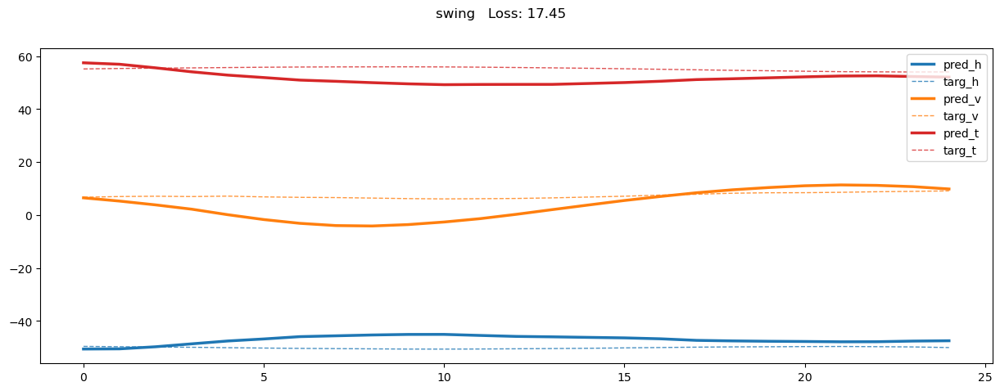

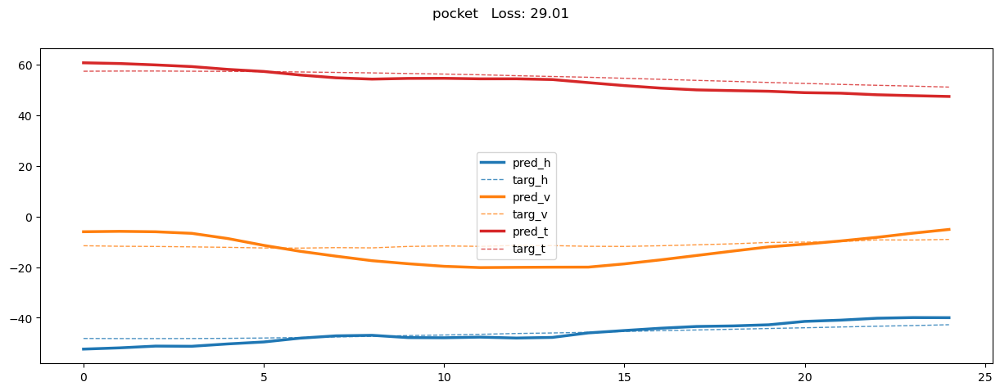

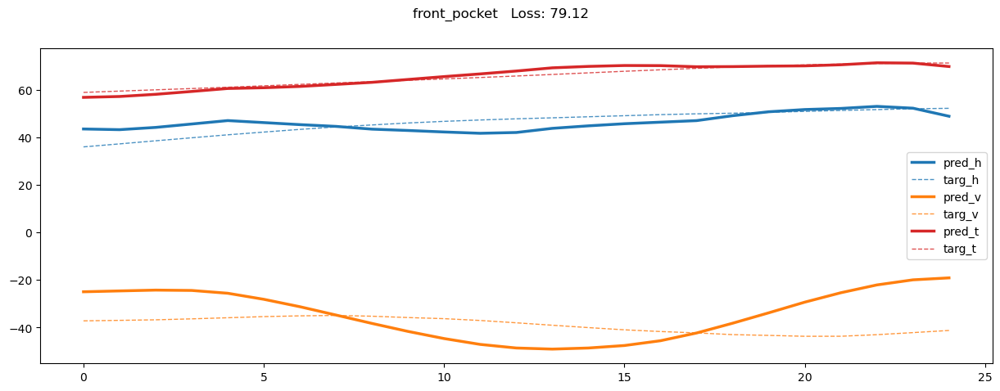

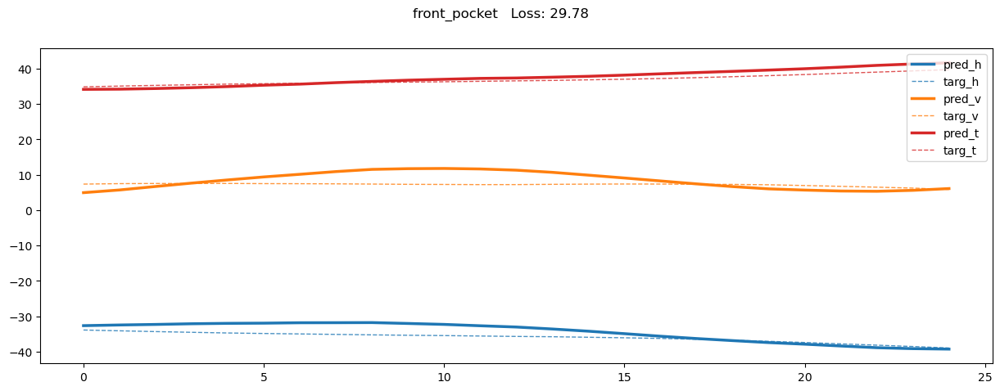

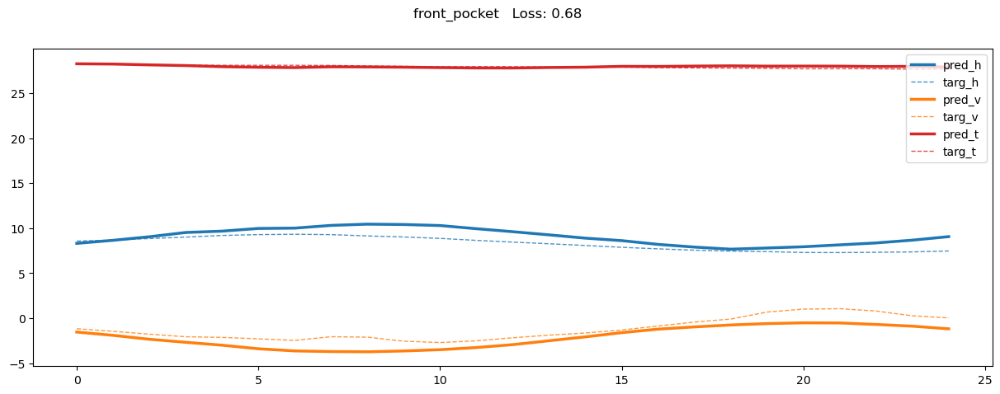

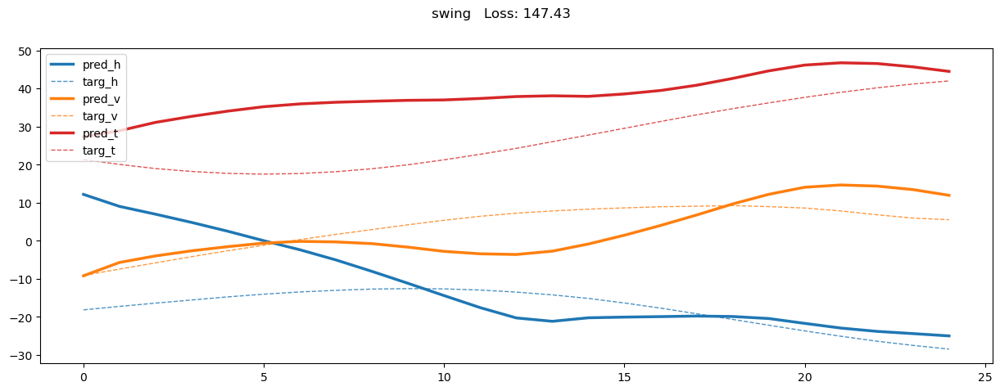

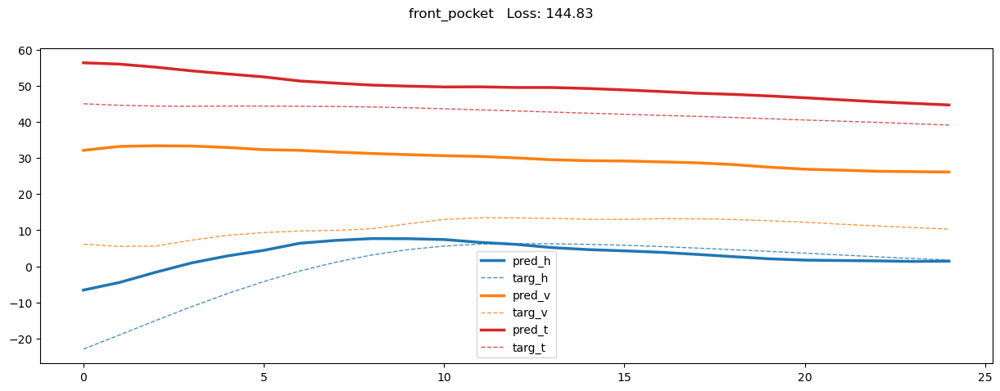

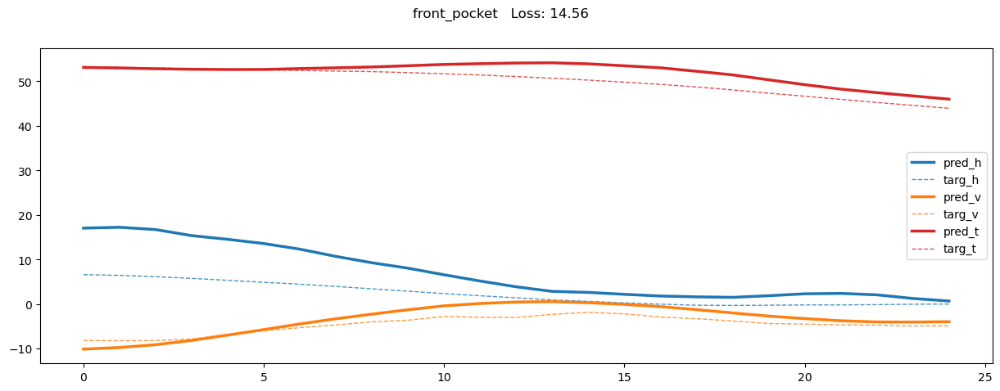

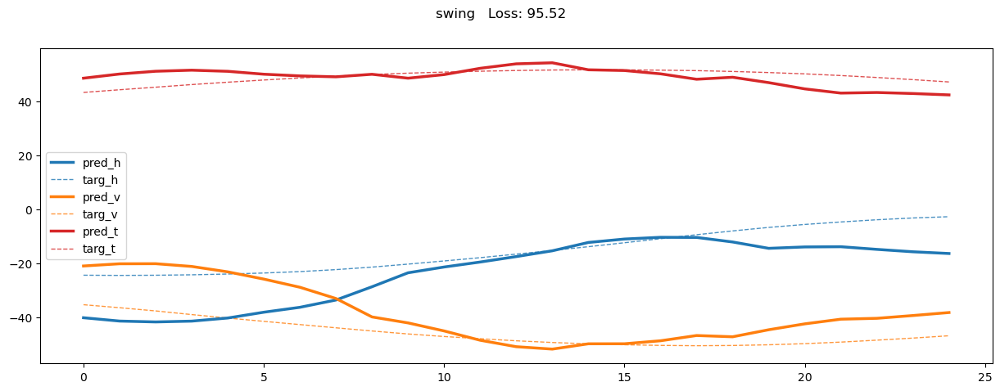

In [44]:
results, cres, clabel = output_eval(model, train_loader)
print(cres.shape, clabel.shape)

print(f'{"loss name":>20}| {"diff x":>8} {"diff y":>8} {"diff z":>8} {"avg":>8}')
for class_label, class_name in classes.items():
    if sum(clabel == class_label) <= 0:
        continue
    dx, dy, dz = cres[clabel == class_label].mean(axis=0)
    print(f'{class_name:>15} loss: {dx:>8.2f} {dy:>8.2f} {dz:>8.2f} {np.mean([dx, dy, dz]):>8.2f}')
dx, dy, dz = cres.mean(axis=0)
print(f'{"average":>15} loss: {dx:>8.2f} {dy:>8.2f} {dz:>8.2f} {np.mean([dx, dy, dz]):>8.2f}')

for rs in results[::1000]:
    plot_result(rs)

(1273, 3) (1273,)
           loss name|   diff x   diff y   diff z      avg
   front_pocket loss:    37.00    31.61    24.16    30.92
         pocket loss:    97.11    63.99    77.04    79.38
          swing loss:    81.29   100.56    90.69    90.84
        average loss:    70.12    64.19    62.31    65.54


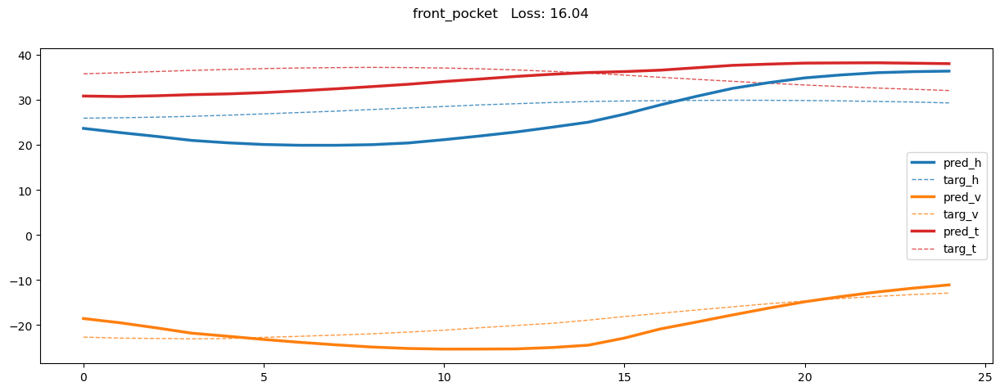

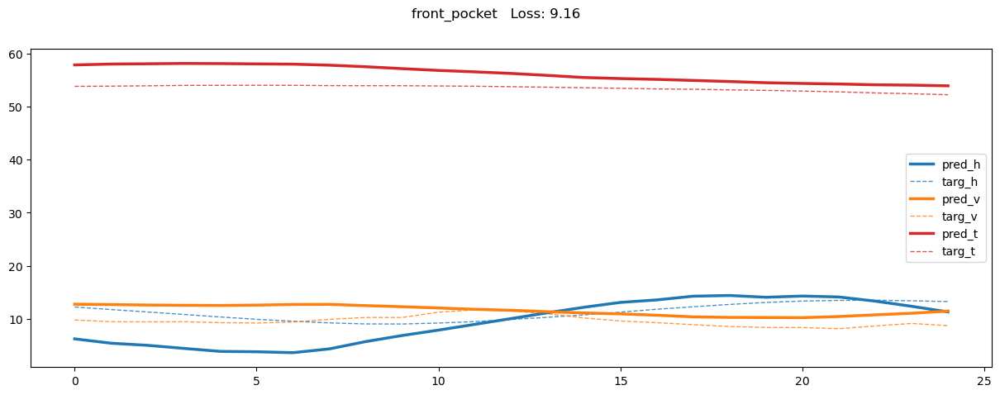

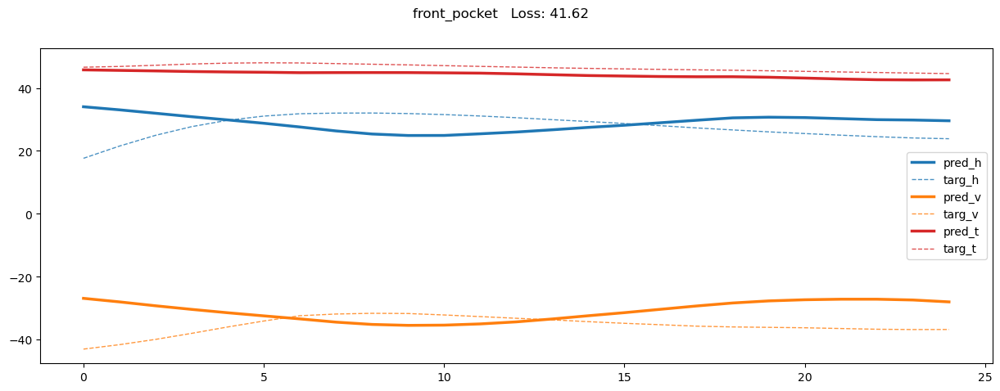

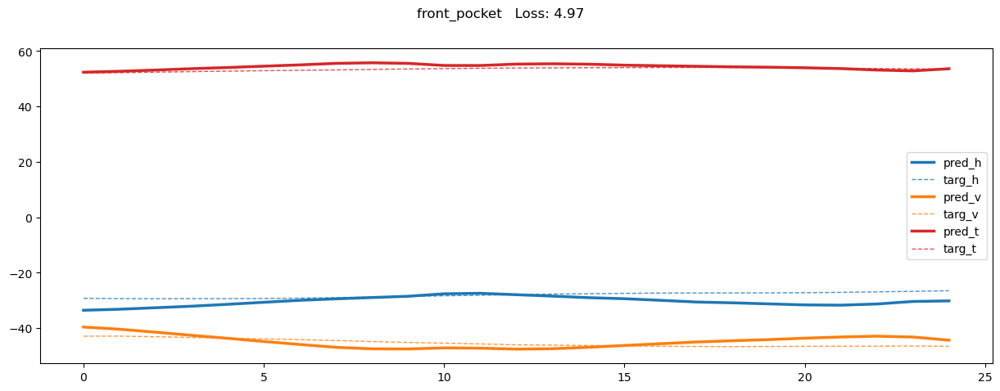

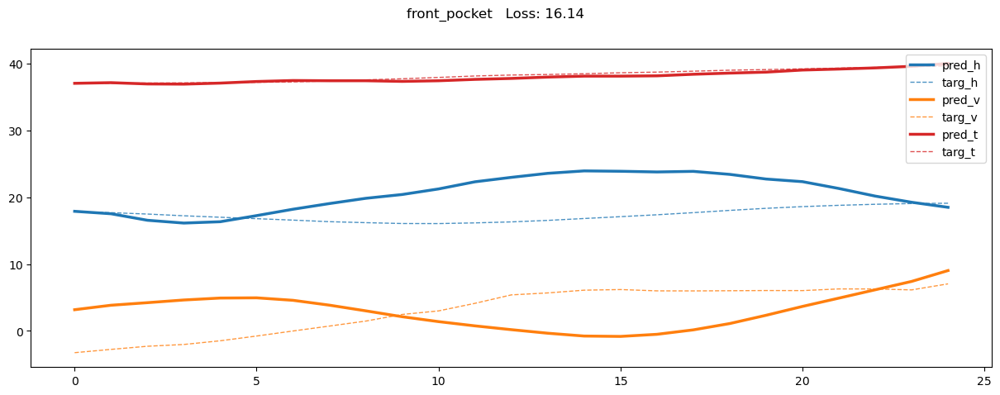

...

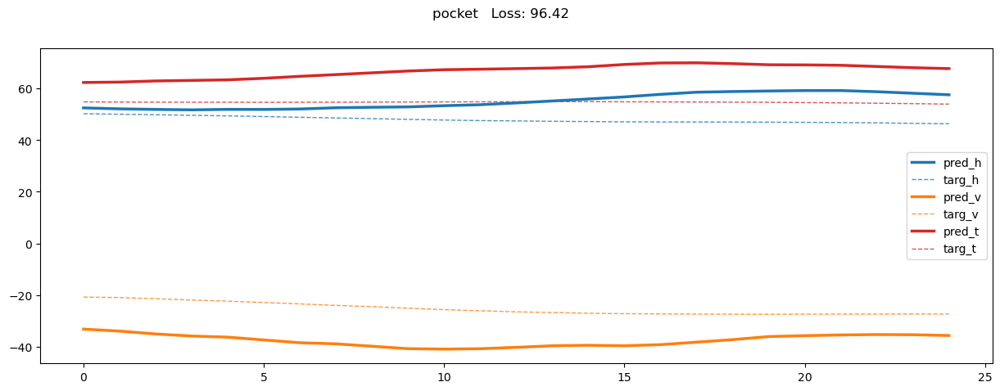

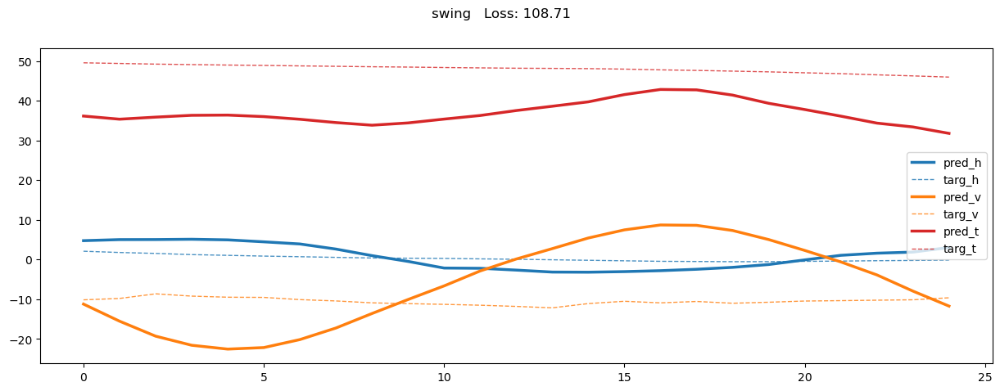

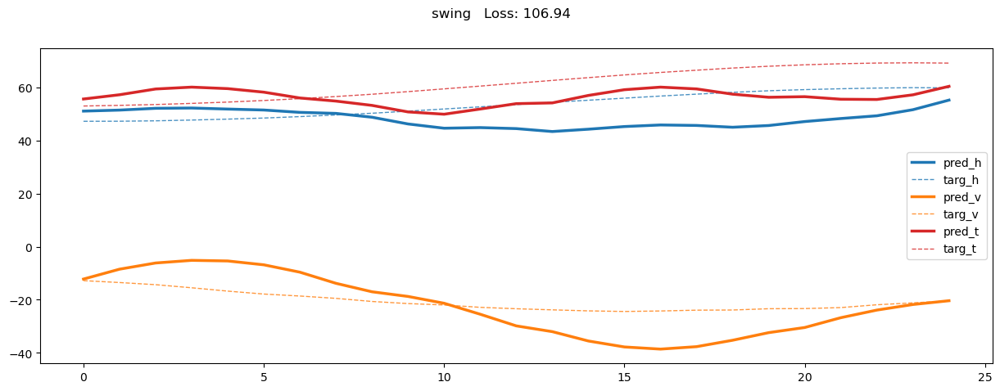

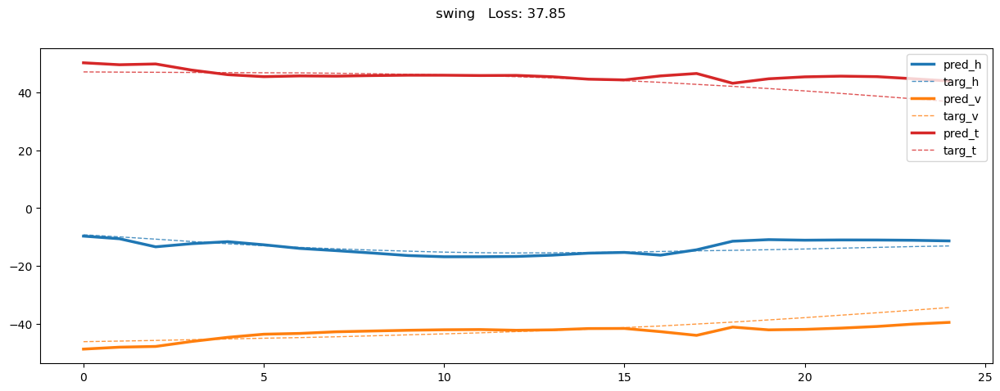

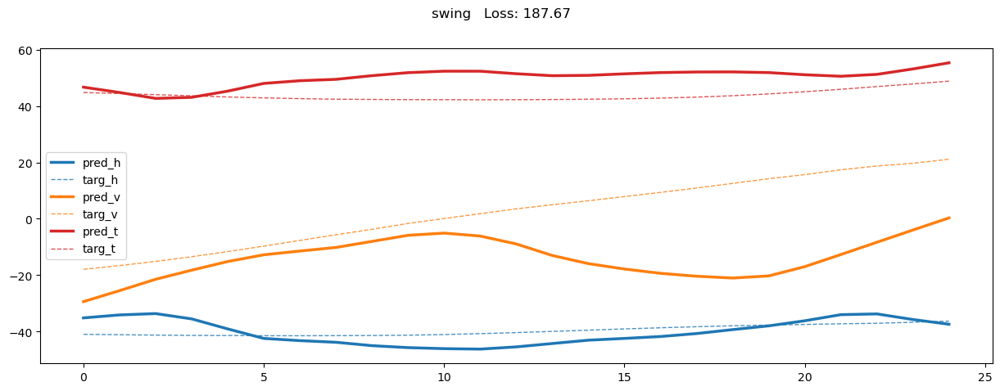

In [45]:
results, cres, clabel = output_eval(model, valid_loader)
print(cres.shape, clabel.shape)

print(f'{"loss name":>20}| {"diff x":>8} {"diff y":>8} {"diff z":>8} {"avg":>8}')
for class_label, class_name in classes.items():
    if sum(clabel == class_label) <= 0:
        continue
    dx, dy, dz = cres[clabel == class_label].mean(axis=0)
    print(f'{class_name:>15} loss: {dx:>8.2f} {dy:>8.2f} {dz:>8.2f} {np.mean([dx, dy, dz]):>8.2f}')
dx, dy, dz = cres.mean(axis=0)
print(f'{"average":>15} loss: {dx:>8.2f} {dy:>8.2f} {dz:>8.2f} {np.mean([dx, dy, dz]):>8.2f}')

for rs in results[::100]:
    plot_result(rs)

In [51]:
def plot_eval_result(result, path):
    pred_mag = np.stack(results[:, 0], axis=0)[:, 0].reshape(-1, 3)
    targ_mag = np.stack(results[:, 1], axis=0)[:, 0].reshape(-1, 3)
    x = np.arange(len(pred_mag))
    
    loss = mse_loss(torch.tensor(pred_mag), torch.tensor(targ_mag)).item()
    
    fig = plt.figure(figsize=(25, 5))
    
    for pm, tm, caxis, color in zip(pred_mag.T, targ_mag.T, ['h', 'v'], ['tab:blue', 'tab:orange']):
        plt.plot(x, pm, label=f'pred_{caxis}', color=color, linewidth=2.5, zorder=2)
        plt.plot(x, tm, '--', label=f'targ_{caxis}', color=color, linewidth=1, alpha=0.8, zorder=1)
    
    pred_total_mag = np.sqrt(np.sum(np.power(pred_mag, 2), axis=-1))
    targ_total_mag = np.sqrt(np.sum(np.power(targ_mag, 2), axis=-1))
    plt.plot(x, pred_total_mag, label=f'pred_t', color='tab:red', linewidth=2.5, zorder=2)
    plt.plot(x, targ_total_mag, '--', label=f'targ_t', color='tab:red', linewidth=1, alpha=0.8, zorder=1)
    
    plt.suptitle(f'{path}   Loss: {loss:.2f}')
    plt.legend()
    plt.show()

In [52]:
def load_data(folder_path):
    source_path = os.path.join(folder_path, 'source')
    target_path = os.path.join(folder_path, 'target')

    #########################
    ##### check devices #####
    #########################
    source_path, target_path = check_data_device(source_path, target_path)

    ####################################
    ##### load and preprocess data #####
    ####################################
    source_df = load_original_data(source_path)
    target_df = load_original_data(target_path)

    source_df, target_df = bound_range(source_df), bound_range(target_df)
    source_df, target_df = align_data(source_df, target_df)
    
    return select_data(source_df), select_data(target_df)

def split_data(df):
    ncols = seq_len
    nrows = len(df) - seq_len + 1
    
    index = np.zeros((nrows, ncols), dtype=int)
    index += np.arange(ncols)
    index += np.arange(nrows).T[:, None]
    
    return df.to_numpy()[index]    

def combine_to_dataloader(source, target):
    dataset = PairDataset(
                        source_data = torch.tensor(source, dtype=torch.float),
                        source_label = np.zeros(len(source)),
                        target_data = torch.tensor(target, dtype=torch.float),
                        target_label = np.zeros(len(target)),
                    )
    dataloader = DataLoader(dataset, batch_size=512, shuffle=False)
    
    return dataloader

def generate_dataloader(folder_path):
    source_df, target_df = load_data(folder_path)
    source_segs, target_segs = split_data(source_df), split_data(target_df)

    return combine_to_dataloader(source_segs, target_segs)

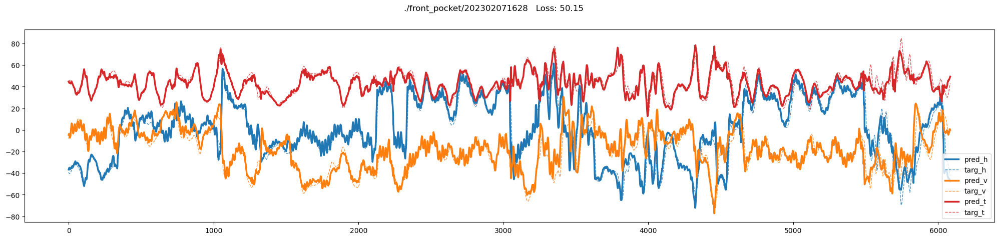

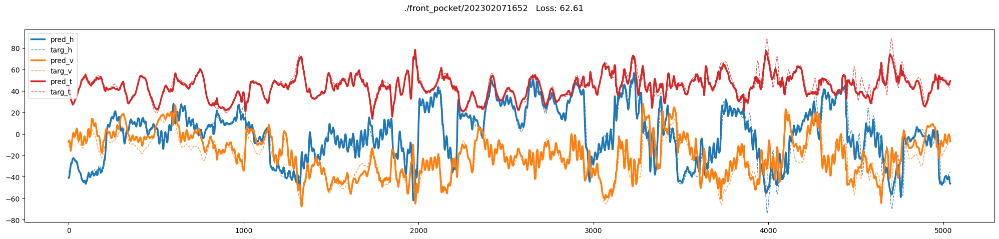

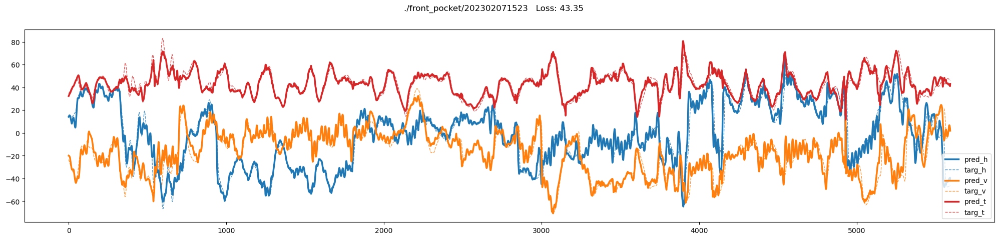

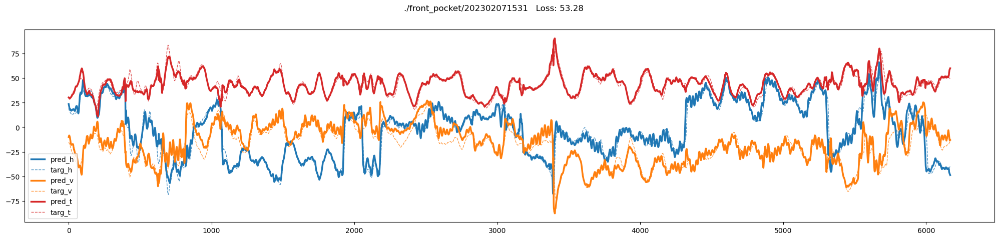

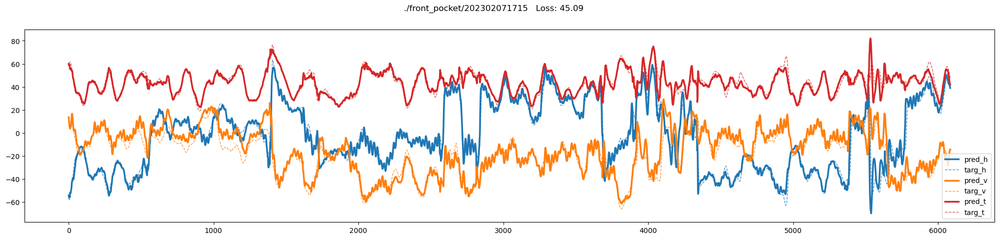

...

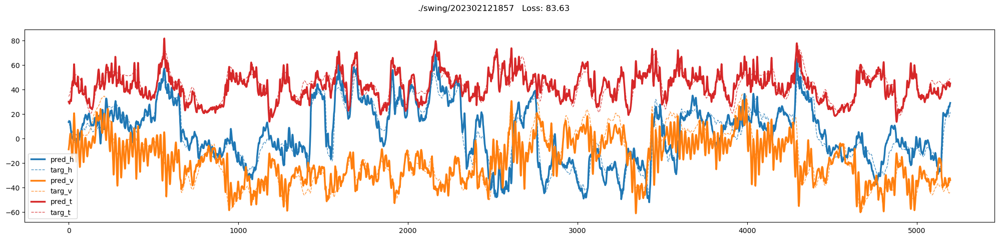

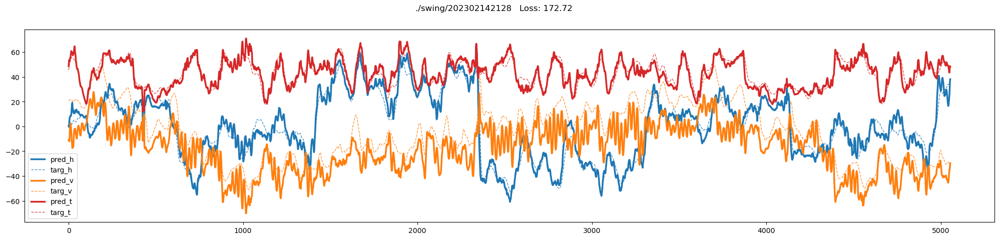

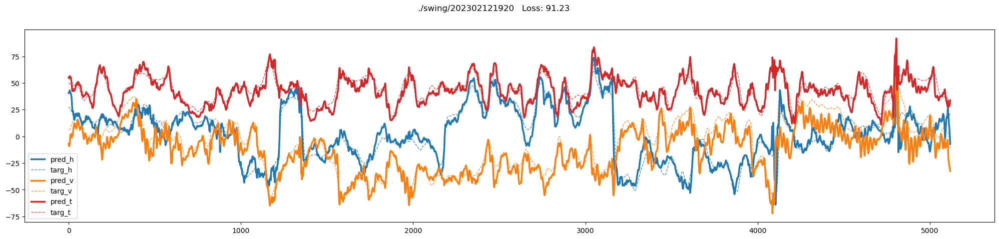

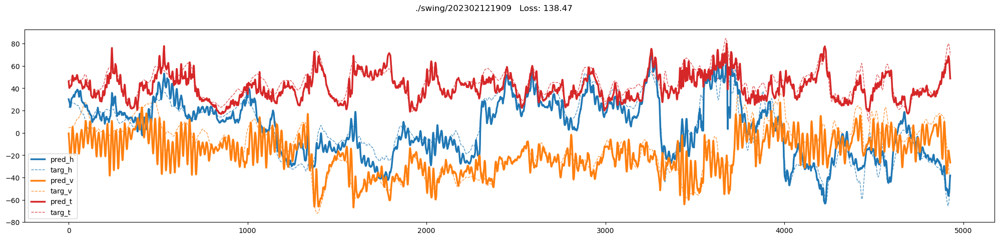

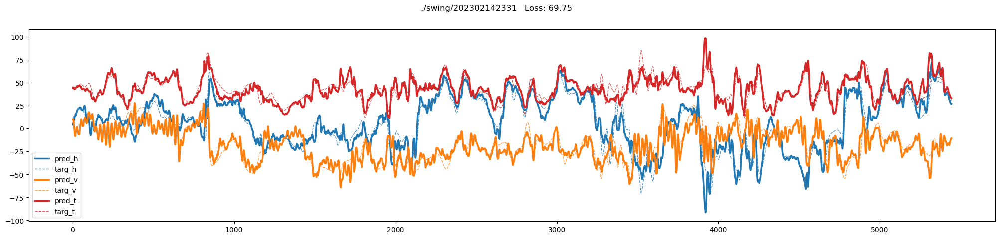

In [53]:
for folder in ['./front_pocket/*', './pocket/*', './swing/*']:
    for path in glob.glob(folder):
        eval_loader = generate_dataloader(path)
        results, _, _ = output_eval(model, eval_loader)
        plot_eval_result(results, path)